#**Project Notebook**
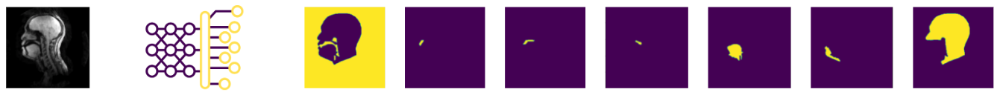

## Dependencies

In [ ]:
#Dependencies to load the dataset in tf.data format
!pip install med_dataloader==0.1.12 -q

In [ ]:
#Link colab to the directories of a given google drive account
import os
from google.colab import drive
ROOT_PATH = os.path.join(os.sep, 'content' , 'gdrive')
drive.mount(ROOT_PATH)

In [3]:
#Possible usefull dependencies
import med_dataloader as mdl
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
import keras


from datetime import datetime
from dateutil.tz import gettz
import SimpleITK as sitk

import scipy
from scipy import ndimage
import cv2

In [ ]:
#Copy the folder containing the dataset on Drive
WD_PATH = os.path.join(ROOT_PATH, 'MyDrive', 'vocal_tract_segmentation')
DATASET_PATH = os.path.join(WD_PATH, 'dataset_vocal_tract_SP')
MODELS_PATH = os.path.join(WD_PATH, 'my_models')

## Data Loader

In [ ]:
#Parameters as global variables
NUM_CLASSES = 7
BATCH_SIZE = 8
EPOCHS = 70

#Data augmentation *args (not necessary)
DATA_AUGMENTATION = False
ROTATION = True#'0,2'
FLIP = True#'horizontal'
CROP_SIZE = True#False

#Percentages for dataset splitting
PERC_TRAIN_DATA = 0.8              #Percentage of the total dataset that will be used for training --> backpropagation and updating of weights and bias are based only on this data
PERC_VALIDATION_DATA = 0.1         #Percentage of the total dataset that will be used during training to evaluate if the Net is overfitting
PERC_TEST_DATA = 0.1               #Percentage of the total dataset that will be used after training to evaluate the global Net performances

train_ds, validation_ds, test_ds = mdl.get_dataset(data_dir = DATASET_PATH,
                                                    percentages = [PERC_TRAIN_DATA, PERC_VALIDATION_DATA, PERC_TEST_DATA],
                                                    batch_size = BATCH_SIZE,
                                                    train_augmentation = DATA_AUGMENTATION,
                                                    random_crop_size = CROP_SIZE,
                                                    random_rotate = ROTATION,
                                                    random_flip = FLIP,
                                                    )

#Empty lists filled from the 3 cicles
x_train = []
y_train = []
x_val = []
y_val = []
x_test = []
y_test = []

i = 0
for img, lbl in train_ds.unbatch():
    x_train.append(img)
    y_train.append(lbl)
    i += 1

for img, lbl in validation_ds.unbatch():
    x_val.append(img)
    y_val.append(lbl)
    i += 1

for img, lbl in test_ds.unbatch():
    x_test.append(img)
    y_test.append(lbl)
    i += 1

print('Tot Imgs: {}'.format(i))

#From list to tensor
x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_val = np.asarray(x_val)
y_val = np.asarray(y_val)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

#Some info
print('x_train shape: {}  y_train shape: {}'.format(x_train.shape, y_train.shape))
print('x_val shape: {}  y_val shape: {}'.format(x_val.shape, y_val.shape))
print('x_test shape: {}  y_test shape: {}'.format(x_test.shape, y_test.shape))

## Preprocessing

In [ ]:
n = 0
x_train_denoised = np.zeros(x_train.shape)
for volume in x_train:
  x_train_denoised[n] = ndimage.median_filter(volume, 3)
  n += 1

n = 0
x_val_denoised = np.zeros(x_val.shape)
for volume in x_val:
  x_val_denoised[n] = ndimage.median_filter(volume, 3)
  n += 1

n = 0
x_test_denoised = np.zeros(x_test.shape)
for volume in x_test:
  x_test_denoised[n] = ndimage.median_filter(volume, 3)
  n += 1

print('x_train_denoised shape: {}  y_train shape: {}'.format(x_train_denoised.shape, y_train.shape))
print('x_val_denoised shape: {}  y_val shape: {}'.format(x_val_denoised.shape, y_val.shape))
print('x_test_denoised shape: {}  y_test shape: {}'.format(x_test_denoised.shape, y_test.shape))

In [ ]:
#if you want to try without preprocessing
x_train_denoised = x_train
x_test_denoised = x_test
x_val_denoised = x_val

## Dataset Visualization

  Img n°: 0 ↓ 


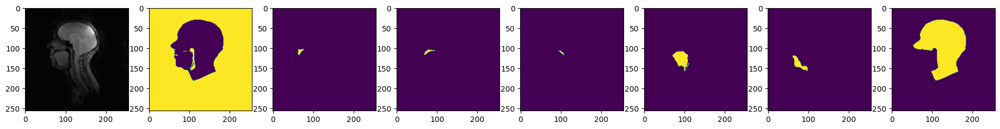

  Img n°: 1 ↓ 


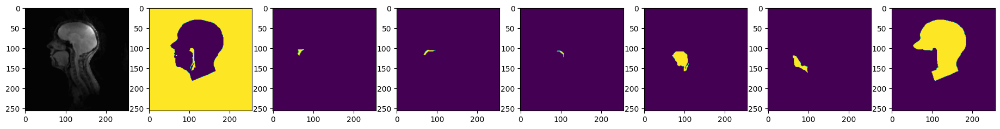

  Img n°: 2 ↓ 


KeyboardInterrupt: 

In [8]:
n = 0
for volume, label in zip(x_train_denoised, y_train):

    print("\033[92m \033[1m Img n°: {} ↓ \033[0m".format(n))
    fig = plt.figure(figsize = [23, 7])
    plt.subplot(1, NUM_CLASSES + 1, 1)
    plt.imshow(volume[:,:,0], cmap="gray")

    for i in range(NUM_CLASSES):
        plt.subplot(1, NUM_CLASSES + 1, i+2)
        plt.imshow(label[:,:,i])

    n += 1
    plt.show(fig)


## Loss Function

Cross Entropy:  $\, L_{CE} = -\sum_{c=1}^{C} \frac{1}{N} \sum_{i=1}^{N} g_i^c\,log\,p_i^c \quad$ [[1]](https://www.sciencedirect.com/science/article/pii/S1361841521000815)

where:
* $C$ = n°classes
* $N$ = n°pixels of image (256x256)
* $g_i^c$ = value of the $i^{th}$ pixel of the $c^{th}$ class of the ground truth label
* $p_i^c$ = value of the $i^{th}$ pixel of the $c^{th}$ class of the predicted label

In [9]:
def cross_entropy(num_classes):
    def loss(y_true, y_pred): #called each iteration (step)

        if len(y_pred.shape) == 4: #2D image
            axis = (1,2)
        elif len(y_pred.shape) == 5: #3D volume
            axis == (1,2,3)

        y_true = tf.cast(y_true, dtype = tf.float32)
        y_pred = tf.cast(y_pred, dtype = tf.float32)

        loss_image = 0.0
        loss_ce = 0.0

        for c in range(num_classes):

            loss_image = tf.math.add(-1*(tf.math.reduce_mean(tf.math.multiply(y_true[...,c], tf.math.log(y_pred[...,c] + 1e-9)), axis = axis)), loss_image)

        loss_ce = tf.math.reduce_mean(loss_image)

        return loss_ce

    return loss

#in model.compile can also be set the default tf.keras.losses.CategoricalCrossentropy()

## Metric



Mean Dice: $\, DICE = \frac{1}{C}  \sum_{c = 1}^{C} \frac{2 \lvert S_g^c \cap S_p^c \rvert}{\lvert S_g^c \rvert + \lvert S_p^c \rvert} = \frac{2\,\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c\,p_i^c}{\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c \,+\, \sum_{c=1}^{C}\sum_{i=1}^{N}p_i^c  } \quad$ [[3]](https://bmcmedimaging.biomedcentral.com/track/pdf/10.1186/s12880-015-0068-x.pdf)

In [10]:
class Mean_DICE(tf.keras.metrics.Metric):
    def __init__(self,
                 num_classes,
                 name='Mean_DICE',
                 smooth_factor = 1e-9,
                 **kwargs):

        super().__init__(name = name, **kwargs)
        self.num_classes = num_classes
        self.axis = None
        self.smooth_factor = smooth_factor

    def update_state(self, y_true, y_pred, sample_weight=None):

        num_classes = self.num_classes
        y_true = tf.cast(y_true, dtype = tf.float32)
        y_pred = tf.cast(y_pred, dtype = tf.float32)

        dice_classes = 0.0
        dice_image = 0.

        if len(y_pred.shape) == 4:
            self.axis = (1,2)
        elif len(y_pred.shape) == 5:
            self.axis = (1,2,3)

        for c in range(num_classes):

            abs_label = tf.math.reduce_sum(y_true[...,c], axis = self.axis )
            abs_pred = tf.math.reduce_sum(y_pred[...,c], axis = self.axis )
            MD_batch_denom = tf.math.add(tf.math.add(abs_label, abs_pred), self.smooth_factor)
            MD_batch_num = tf.math.add(2*tf.math.reduce_sum(tf.math.multiply(y_true[...,c], y_pred[...,c]), axis = self.axis), self.smooth_factor)
            dice_image = tf.math.divide(MD_batch_num, MD_batch_denom)
            dice_classes = tf.math.add(dice_image, dice_classes)

        self.mean_dice = tf.math.divide(dice_classes, num_classes)
        self.mean_dice = tf.math.reduce_mean(self.mean_dice)

    def result(self):
        return self.mean_dice

    def get_config(self):
        config = super().get_config()
        config.update({'num_classes': self.num_classes})
        return config

    @ classmethod
    def from_config(cls, config):
        return cls(**config)

## Architectures

In [11]:
def double_conv_block(x, n_filters):
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "linear", kernel_initializer = "he_normal")(x)
   x = layers.BatchNormalization()(x)
   x = layers.Activation("relu")(x)
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "linear", kernel_initializer = "he_normal")(x)
   x = layers.BatchNormalization()(x)
   x = layers.Activation("relu")(x)
   return x

def downsample_block(x, n_filters):
   f = double_conv_block(x, n_filters)
   p = layers.MaxPool2D(2)(f)
   return f, p

def upsample_block(x, conv_features, n_filters):
   # upsample
   x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
   # concatenate
   x = layers.concatenate([x, conv_features])
   # Conv2D twice with ReLU activation
   x = double_conv_block(x, n_filters)
   return x

In [19]:
def build_unet_model():
  inputs = layers.Input(shape=(256,256,1))
  # encoder: contracting path - downsample
  # 1 - downsample
  f1, p1 = downsample_block(inputs, 64)
  # 2 - downsample
  f2, p2 = downsample_block(p1, 128)
  # 3 - downsample
  f3, p3 = downsample_block(p2, 256)
  # 4 - downsample
  f4, p4 = downsample_block(p3, 512)
  p4 = layers.Dropout(0.3)(p4)
  # 5 - bottleneck
  bottleneck = double_conv_block(p4, 1024)
  bottleneck = layers.Dropout(0.3)(bottleneck)
  # decoder: expanding path - upsample
  # 6 - upsample
  u6 = upsample_block(bottleneck, f4, 512)
  # 7 - upsample
  u7 = upsample_block(u6, f3, 256)
  # 8 - upsample
  u8 = upsample_block(u7, f2, 128)
  # 9 - upsample
  u9 = upsample_block(u8, f1, 64)
  # outputs
  outputs = layers.Conv2D(NUM_CLASSES, 3, padding="same", activation = "softmax")(u9)
  # unet model with Keras Functional API
  unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
  return unet_model

In [20]:
#Use our achitecture defined above...
unet_model = build_unet_model()

In [ ]:
#!pip install --upgrade pip
#!pip install --upgrade tensorflow
#!pip install keras --upgrade
#!pip install keras-unet
!pip install --upgrade tensorflow
from tensorflow.keras.models import Model
from keras_unet.models import custom_unet

In [ ]:
#RUN IF YOU WANT TO USE THE CUSTOM UNET MODEL FROM https://github.com/karolzak/keras-unet/blob/master/keras_unet/models/custom_unet.py
unet_model = custom_unet(
    input_shape=(256, 256, 1),
    use_batch_norm=True,
    num_classes=NUM_CLASSES,
    filters=64,
    dropout=0.4,
    output_activation='softmax')

## Model Building & Callbacks

In [29]:
'''
#mode.compile --> define loss, optimizer and metrics to be used during training
unet_model.compile(optimizer=tf.keras.optimizers.Adam(beta_1=0.9,beta_2=0.999,epsilon=1e-08),
                  loss = cross_entropy(NUM_CLASSES),#tf.keras.losses.categorical_cross_entropy
                  metrics = Mean_DICE(num_classes = NUM_CLASSES)
                  )
'''
#Create a directory tree to neatly save the models
training_path = os.path.join(WD_PATH, 'my_models','Training_' + datetime.now(gettz("Europe/Rome")).strftime("%Y-%m-%d-T%H:%M"))
checkpoint_path = os.path.join(training_path, 'Checkpoints')
best_model_path = os.path.join(training_path, 'Best Model')

if not os.path.exists(training_path):
    os.mkdir(training_path)
if not os.path.exists(checkpoint_path):
    os.mkdir(checkpoint_path)
if not os.path.exists(best_model_path):
    os.mkdir(best_model_path)

#Callback to keep track of the model with the best validation Mean_DICE

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = best_model_path,
    monitor = 'val_Mean_DICE',
    mode = 'max',
    save_best_only ='True',
    verbose = 1
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_Mean_DICE',
    patience = 8, #Number of epochs before we stop if we have no improvement
    verbose = 2,
    mode = 'max',
    #start_from_epoch=10,
)
    #baseline = 0.85,
    #restore_best_weights = 'True', # Restore model weights from the epoch with the best value of the monitored quantity
    #min_delta = 0.005 #minimum improvement in the monitor score between 2 epochs and below this threshold, the change in monitor score is not considered as an improvement. If we leave it undefined sets at 0


#Callback for the tensorboard monitoring
tensorboard_callbacks = tf.keras.callbacks.TensorBoard(log_dir = checkpoint_path, histogram_freq = 1, write_graph = True,)

## Tensorboard

In [35]:
%reload_ext tensorboard

In [36]:
%tensorboard --logdir "$checkpoint_path"

Reusing TensorBoard on port 6006 (pid 11176), started 0:01:11 ago. (Use '!kill 11176' to kill it.)

<IPython.core.display.Javascript object>

## Model Training & Evaluation

In [ ]:
#GRIDSEARCH
i = 0
#batch size
#dropout
#number of filters
#..
#import pandas as pd
#results = np.zero
from keras.models import load_model

for batch_size_gs in[4, 32]:
  for dropout_gs in[0, 0.25, 0.5]:
    print('CURRENTLY USING batch size of:',batch_size_gs,'and dropout of:',dropout_gs)
    current_checkpoint_path = os.path.join(checkpoint_path,'training_'+str(i))
    current_best_model_path = os.path.join(best_model_path, 'best_model_'+str(i))
    if not os.path.exists(current_checkpoint_path):
      os.mkdir(current_checkpoint_path)
    if not os.path.exists(current_best_model_path):
      os.mkdir(current_best_model_path)
    tensorboard_callbacks = tf.keras.callbacks.TensorBoard(log_dir = current_checkpoint_path, histogram_freq = 1, write_graph = True,)
    model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = os.path.join(current_best_model_path,'training_'+str(i)),#+'.h5'                                                                                  ),
      monitor = 'val_Mean_DICE',
      mode = 'max',
      save_best_only ='True',
      verbose = 1)
    #building and compiling of the model if necessary
    def build_unet_model():
      inputs = layers.Input(shape=(256,256,1))
      # encoder: contracting path - downsample
      # 1 - downsample
      f1, p1 = downsample_block(inputs, 64)
      # 2 - downsample
      f2, p2 = downsample_block(p1, 128)
      # 3 - downsample
      f3, p3 = downsample_block(p2, 256)
      # 4 - downsample
      f4, p4 = downsample_block(p3, 512)
      p4 = layers.Dropout(dropout_gs)(p4)
      # 5 - bottleneck
      bottleneck = double_conv_block(p4, 1024)
      bottleneck = layers.Dropout(dropout_gs)(bottleneck)
      # decoder: expanding path - upsample
      # 6 - upsample
      u6 = upsample_block(bottleneck, f4, 512)
      # 7 - upsample
      u7 = upsample_block(u6, f3, 256)
      # 8 - upsample
      u8 = upsample_block(u7, f2, 128)
      # 9 - upsample
      u9 = upsample_block(u8, f1, 64)
      # outputs
      outputs = layers.Conv2D(NUM_CLASSES, 3, padding="same", activation = "softmax")(u9)
      # unet model with Keras Functional API
      unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
      return unet_model
    unet_model = build_unet_model()
    unet_model.compile(optimizer=tf.keras.optimizers.Adam(beta_1=0.9,beta_2=0.999,epsilon=1e-08),
                  loss = cross_entropy(NUM_CLASSES),#tf.keras.losses.categorical_cross_entropy
                  metrics = Mean_DICE(num_classes = NUM_CLASSES)
                  )
    #training of the current model
    model_history = unet_model.fit(
      x = x_train_denoised,
      y = y_train,
      batch_size = batch_size_gs,
      epochs = 70,
      # We pass some validation at the end of each epoch
      validation_data = (x_val_denoised, y_val),
      callbacks = [model_checkpoint,tensorboard_callbacks, early_stopping],
      verbose = 2,)
    #best_model = tf.keras.models.load_model(current_best_model_path,training+str(i),
                                        #custom_objects = {'loss': cross_entropy(num_classes = 7), #remove this if wheighted
                                                         # 'Mean_DICE': Mean_DICE(num_classes = 7)})

    #test_scores = best_model.evaluate(x = x_test_denoised, y = y_test, verbose = 2)

    #print('Test score for batch size',batch_size_gs,'and dropout',dropout_gs,':',test_scores)

    i += 1

In [ ]:
#model.fit --> actual training of the model using back-propagation for updating weights

model_history = unet_model.fit(
    x = x_train_denoised,
    y = y_train,
    batch_size = BATCH_SIZE,
    epochs = 70,#!!!
    # We pass some validation at the end of each epoch
    validation_data = (x_val_denoised, y_val),
    callbacks = [model_checkpoint,tensorboard_callbacks, early_stopping],
    verbose = 2,
)

Epoch 1/70

Epoch 1: val_Mean_DICE improved from 0.25256 to 0.31180, saving model to /content/gdrive/MyDrive/my_vocal_tract_PW/my_models/Training_2024-01-24-T16:12/Best Model/best_model_0/training_0
82/82 - 95s - loss: 0.0280 - Mean_DICE: 0.8832 - val_loss: 0.3037 - val_Mean_DICE: 0.3118 - 95s/epoch - 1s/step
Epoch 2/70

Epoch 2: val_Mean_DICE improved from 0.31180 to 0.48260, saving model to /content/gdrive/MyDrive/my_vocal_tract_PW/my_models/Training_2024-01-24-T16:12/Best Model/best_model_0/training_0
82/82 - 68s - loss: 0.0273 - Mean_DICE: 0.8786 - val_loss: 0.1128 - val_Mean_DICE: 0.4826 - 68s/epoch - 833ms/step
Epoch 3/70

Epoch 3: val_Mean_DICE improved from 0.48260 to 0.65066, saving model to /content/gdrive/MyDrive/my_vocal_tract_PW/my_models/Training_2024-01-24-T16:12/Best Model/best_model_0/training_0
82/82 - 68s - loss: 0.0258 - Mean_DICE: 0.8680 - val_loss: 0.0662 - val_Mean_DICE: 0.6507 - 68s/epoch - 834ms/step
Epoch 4/70

Epoch 4: val_Mean_DICE improved from 0.65066 to 0

In [ ]:
#Load the best model saved by training tf.keras.callbacks.ModelCheckpoint callback...
'''
best_model = tf.keras.models.load_model(best_model_path,#'path.h5',#corregi qui, dovrebbe essere best model path
                                        custom_objects = {'loss': cross_entropy(num_classes = NUM_CLASSES),
                                                          'Mean_DICE': Mean_DICE(num_classes = NUM_CLASSES)})
'''
#or load a past model by writing the correct folder in the path

training_path = os.path.join(MODELS_PATH,'Training_2022-12-10-T23:02') #model to be loaded
checkpoint_path = os.path.join(training_path, 'Checkpoints')
best_model_path = os.path.join(training_path, 'Best Model')
best_model = tf.keras.models.load_model(best_model_path,
                                        custom_objects = {'loss': cross_entropy(num_classes = 7), #remove this if wheighted
                                                          'Mean_DICE': Mean_DICE(num_classes = 7)})


In [ ]:
#Network evaluation on the test set
test_scores = best_model.evaluate(x = x_test_denoised, y = y_test, verbose = 2)

## Predictions

In [ ]:
predictions = best_model.predict(x_test_denoised)
print('prediction shape: {}'.format(predictions.shape))

## Postprocessing

My idea of preprocessing works like this:
We have backgroung [0], head [6], and "normal" classes, [1] through [5].

1.   Each normal class can have only one island (connected pixels of that class), so all island except the biggest of each normal class are changed to class head [6].
2.   Also head [6] can have only one class, but in this case the islands are changed to background [0].
3.   Then all background islands are analyzed to see how many neighbours they have, and, if they have only one, they are just a hole and thus are changed to the outer class.

In [ ]:
def calcola_mean_dice(y_true, y_pred, sample_weight=None):#precision and recall
        smooth_factor= 1e-9
        num_classes = 7
        y_true = tf.cast(y_true, dtype = tf.float32)
        y_pred = tf.cast(y_pred, dtype = tf.float32)

        dice_classes = 0.0
        dice_image = 0.

        if len(y_pred.shape) == 4:
            axis = (1,2)
        elif len(y_pred.shape) == 5:
            axis = (1,2,3)
        else:
          axis = (0,1)
        for c in range(num_classes):

            abs_label = tf.math.reduce_sum(y_true[...,c], axis = axis)
            abs_pred = tf.math.reduce_sum(y_pred[...,c], axis = axis)
            MD_batch_denom = tf.math.add(tf.math.add(abs_label, abs_pred), smooth_factor)
            MD_batch_num = tf.math.add(2*tf.math.reduce_sum(tf.math.multiply(y_true[...,c], y_pred[...,c]), axis = axis), smooth_factor)
            dice_image = tf.math.divide(MD_batch_num, MD_batch_denom)
            dice_classes = tf.math.add(dice_image, dice_classes)

        mean_dice = tf.math.divide(dice_classes, num_classes)
        mean_dice = tf.math.reduce_mean(mean_dice)

        return mean_dice

#defining functions for island method
def find_island_size(island_matrix,island_index):
  island_size = 0
  for i in range(island_matrix.shape[0]):
    for j in range(island_matrix.shape[1]):
      if island_matrix[i,j] == island_index:
        island_size += 1
  return island_size

def find_islands(f_image):
  island_matrix = np.zeros(f_image.shape)
  island_index = 1
  for i in range(island_matrix.shape[0]):
    if i == 0:
      prima_riga = 1
    else:
      prima_riga = 0
    for j in range(island_matrix.shape[1]):
      if j == 0:
        prima_colonna = 1
      else:
        prima_colonna = 0
      if j+1 == island_matrix.shape[1]:
        ultima_colonna = 1
      else:
        ultima_colonna = 0
      if f_image[i,j] == 1: #when I find a new 1 I look if it sees any other island...
        island_array = np.array(np.zeros(4))
        if prima_riga == 1:
          island_array[0] = 0
          island_array[1] = 0
          island_array[2] = 0
          if prima_colonna == 1:
            island_array[3] = 0
          else:
            island_array[3] = island_matrix[i,j-1]
        else:
          if prima_colonna == 1:
            island_array[0] = 0
            island_array[1] = island_matrix[i-1,j]
            island_array[2] = island_matrix[i-1,j+1]
            island_array[3] = 0
          elif ultima_colonna == 1:
            island_array[0] = island_matrix[i-1,j-1]
            island_array[1] = island_matrix[i-1,j]
            island_array[2] = 0
            island_array[3] = island_matrix[i,j-1]
          else:
            island_array[0] = island_matrix[i-1,j-1]
            island_array[1] = island_matrix[i-1,j]
            island_array[2] = island_matrix[i-1,j+1]
            island_array[3] = island_matrix[i,j-1]
        island_array = island_array[island_array != 0] #remove all zeros from array (neigbhouring cells that are not on an island)
        island_array = np.unique(island_array)
        caso = len(island_array)
        if caso == 0: #there are no neighbouring islands
          island_matrix[i,j] = island_index
          island_index+=1
        elif caso == 1: #there is exactly 1 nearby island
          island_matrix[i,j] = island_array
        elif caso == 2: #there are two islands nearby -> they need to be connected to be the same island (I chose the minimun island index)
          good_island = island_array[0]
          island_matrix[i,j] = good_island
          bad_island = island_array[1]
          for y in range(i):
            for x in range(island_matrix.shape[1]):
              if island_matrix[y,x] == bad_island:
                island_matrix[y,x] = good_island #change all previous bad indexes to be the good index
          for x in range(j):
            if island_matrix[i,x] == bad_island:
                island_matrix[i,x] = good_island #change all previous bad indexes to be the good index
  unique_islands = np.unique(island_matrix[:,:])[1:]
  island_list = np.zeros(([len(unique_islands),2]))
  for q in range(len(unique_islands)):
    island_size = find_island_size(island_matrix, unique_islands[q])
    island_list[q][0] = unique_islands[q]
    island_list[q][1] = island_size
  island_list = island_list[island_list[:, 1].argsort()]
  return island_matrix, island_list

def erase_islands(image,clas,min_island_size): #this funct. wants a [256][256][7] ndarray
  island_matrix, island_list = find_islands(image[:,:,clas])
  for k in range(island_list.shape[0]-1): #for every island found except the biggest one
    if island_list[k][1] < min_island_size: #to be determined
      for i in range(island_matrix.shape[0]):
        for j in range(island_matrix.shape[1]):
          if island_matrix[i][j] == island_list[k][0]:
            image[i][j][clas] = 0 #island is erased
            if clas != 6:
              image[i][j][6] = 1 #class "head" substitutes the island
            else:
              image[i][j][0] = 1 #class "background" substitutes the island "head"
  return image
'''
def find_neighbour(i,j,image_size_y,image_size_x):
#this function helps managing the pixels on the edges of the image
  if i == 0:
    y = [1, 2]
  elif i+1 == image_size_y:
    y = [0, 1]
  else:
    y = [0, 1, 2]
  if j == 0:
    x = [1, 2]
  elif j+1 == image_size_x:
    x = [0, 1]
  else:
    x = [0, 1, 2]
  return y, x

def erase_background_islands(image): #doesnt work
  island_matrix, island_list = find_islands(image[:,:,0])
  for k in range(island_list.shape[0]-1):
    neighbours_number = 0
    skip_flag = 0
    while skip_flag == 0:
      for i in range(island_matrix.shape[0]):
        for j in range(island_matrix.shape[1]):
          if island_matrix[i][j] == island_list[k][0]:
            y, x = find_neighbour(i,j,island_matrix.shape[0], island_matrix.shape[1])
            for i2 in y:
              for j2 in x:
                if island_matrix[i-1+i2][j-1+j2] != island_matrix[i][j]:
                  if neighbours_number == 0:
                    neighbours_number = 1
                    neighbour = np.argmax(image[i-1+i2][j-1+j2][:])
                  if neighbours_number == 1:
                    if np.argmax(image[i-1+i2][j-1+j2][:]) != neighbour:
                      neighbour_number = 2
                      skip_flag = 1
      skip_flag = 1
    if neighbours_number == 1:
      island_size = find_island_size(island_matrix, k)
      if island_size < 50: #MIN_ISLAND_SIZE, to be determined
        for i in range(island_matrix.shape[0]):
          for j in range(island_matrix.shape[1]):
            if island_matrix[i][j] == island_list[k][0]:
              image[i][j][0] = 0 #background hole is changed to nearby class
              image[i][j][neighbour] = 1
  return image
'''

'\ndef find_neighbour(i,j,image_size_y,image_size_x):\n#this function helps managing the pixels on the edges of the image\n  if i == 0:\n    y = [1, 2]\n  elif i+1 == image_size_y:\n    y = [0, 1]\n  else:\n    y = [0, 1, 2]\n  if j == 0:\n    x = [1, 2]\n  elif j+1 == image_size_x:\n    x = [0, 1]\n  else:\n    x = [0, 1, 2]\n  return y, x\n  \ndef erase_background_islands(image): #doesnt work\n  island_matrix, island_list = find_islands(image[:,:,0])\n  for k in range(island_list.shape[0]-1):\n    neighbours_number = 0\n    skip_flag = 0\n    while skip_flag == 0:\n      for i in range(island_matrix.shape[0]):\n        for j in range(island_matrix.shape[1]):\n          if island_matrix[i][j] == island_list[k][0]:\n            y, x = find_neighbour(i,j,island_matrix.shape[0], island_matrix.shape[1])\n            for i2 in y:\n              for j2 in x:\n                if island_matrix[i-1+i2][j-1+j2] != island_matrix[i][j]:\n                  if neighbours_number == 0:\n             

In [ ]:
#changing the predictions to be 1 where the max is and 0 everywhere else
predictions_binary = np.zeros(predictions.shape)
for image in range(predictions.shape[0]):
  for i in range(predictions.shape[1]):
    for j in range(predictions.shape[2]):
      max_index = np.argmax(predictions[image,i,j,:])
      predictions_binary[image,i,j,max_index] = 1
      predictions_binary[image,i,j,:max_index] = 0
      predictions_binary[image,i,j,max_index+1:] = 0

#score for raw images
length = y_test.shape[0]
score_cum = 0
for k in range(y_test.shape[0]):
  mean_dice = calcola_mean_dice(y_test[k,:,:,:],predictions_binary[k,:,:,:])
  score_cum += mean_dice
score = score_cum/length
print('Mean_DICE for raw predicted images: ',score)

#fltering results with median filter of size 3
predictions_filtered = np.zeros(predictions_binary.shape)
for image in range(predictions_filtered.shape[0]):
  for clas in range(predictions_filtered.shape[3]):
    predictions_filtered[image,:,:,clas] = ndimage.median_filter(predictions_binary[image,:,:,clas], 3)

length = y_test.shape[0]
score_cum = 0
for k in range(y_test.shape[0]):
  mean_dice = calcola_mean_dice(y_test[k,:,:,:],predictions_filtered[k,:,:,:])
  score_cum += mean_dice
score = score_cum/length
print('Mean_DICE for filtered images: ',score)

Mean_DICE for raw predicted images:  tf.Tensor(0.91036767, shape=(), dtype=float32)
Mean_DICE for filtered images:  tf.Tensor(0.9087161, shape=(), dtype=float32)


In [ ]:
predictions_islands = predictions_binary
min_island_size = 12 #seems to be the best
for imm in range(predictions_islands.shape[0]):
  #for clas in range(predictions_binary_PP.shape[3]):
  for clas in range(NUM_CLASSES):
    predictions_islands[imm,:,:,:] = erase_islands(predictions_islands[imm,:,:,:],clas,min_island_size)#30 is the min size after wich an island is NOT erased
  #predictions_binary_PP[imm,:,:,:] = erase_background_islands(predictions_binary_PP[imm,:,:,:])  #doesn't work

predictions_filtered_then_islands = predictions_filtered
for imm in range(predictions_filtered_then_islands.shape[0]):
  #for clas in range(predictions_binary_PP.shape[3]):
  for clas in range(NUM_CLASSES):
    predictions_filtered_then_islands[imm,:,:,:] = erase_islands(predictions_filtered_then_islands[imm,:,:,:],clas,min_island_size)#30 is the min size after wich an island is NOT erased
  #predictions_binary_PP[imm,:,:,:] = erase_background_islands(predictions_binary_PP[imm,:,:,:])  #doesn't work

length = y_test.shape[0]
score_cum = 0
for k in range(y_test.shape[0]):
  mean_dice = calcola_mean_dice(y_test[k,:,:,:],predictions_islands[k,:,:,:])
  score_cum += mean_dice
score = score_cum/length
print('Mean_DICE for islands images: ',score)

length = y_test.shape[0]
score_cum = 0
for k in range(y_test.shape[0]):
  mean_dice = calcola_mean_dice(y_test[k,:,:,:],predictions_filtered_then_islands[k,:,:,:])
  score_cum += mean_dice
score = score_cum/length
print('Mean_DICE for filtered then islands images: ',score)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
Mean_DICE for islands images:  tf.Tensor(0.91054153, shape=(), dtype=float32)
Mean_DICE for filtered then islands images:  tf.Tensor(0.90878034, shape=(), dtype=float32)


In [ ]:
#fltering results of islands with median filter of size 3
predictions_islands_then_filtered = np.zeros(predictions_binary.shape)
for image in range(predictions_islands_then_filtered.shape[0]):
  for clas in range(predictions_islands_then_filtered.shape[3]):
    predictions_islands_then_filtered[image,:,:,clas] = ndimage.median_filter(predictions_islands[image,:,:,clas], 3)

length = y_test.shape[0]
score_cum = 0
for k in range(y_test.shape[0]):
  mean_dice = calcola_mean_dice(y_test[k,:,:,:],predictions_islands_then_filtered[k,:,:,:])
  score_cum += mean_dice
score = score_cum/length
print('Mean_DICE for islands then filtered images: ',score)

In [ ]:
#FINDING BEST MIN_ISLAND_SIZE
length = y_test.shape[0]
for min_size in(11,12,13,14,15,16,17,18,19):
  print(min_size)
  predictions_binary = np.zeros(predictions.shape)
  for image in range(predictions.shape[0]):
    for i in range(predictions.shape[1]):
      for j in range(predictions.shape[2]):
        max_index = np.argmax(predictions[image,i,j,:])
        predictions_binary[image,i,j,max_index] = 1
        predictions_binary[image,i,j,:max_index] = 0
        predictions_binary[image,i,j,max_index+1:] = 0
  predictions_islands = predictions_binary
  for imm in range(predictions_islands.shape[0]):
    #for clas in range(predictions_binary_PP.shape[3]):
    for clas in [0,1,2,3,4,5,6]:
      predictions_islands[imm,:,:,:] = erase_islands(predictions_islands[imm,:,:,:],clas,min_size)#30 is the min size after wich an island is NOT erased
    #predictions_binary_PP[imm,:,:,:] = erase_background_islands(predictions_binary_PP[imm,:,:,:])  #doesn't work
  score_cum = 0
  for k in range(y_test.shape[0]):
    mean_dice = calcola_mean_dice(y_test[k,:,:,:],predictions_islands[k,:,:,:])
    score_cum += mean_dice
  score = score_cum/length
  print('Mean_DICE: ',score)

11
Mean_DICE:  tf.Tensor(0.9105181, shape=(), dtype=float32)
12
Mean_DICE:  tf.Tensor(0.91054153, shape=(), dtype=float32)
13
Mean_DICE:  tf.Tensor(0.9105211, shape=(), dtype=float32)
14
Mean_DICE:  tf.Tensor(0.91043806, shape=(), dtype=float32)
15
Mean_DICE:  tf.Tensor(0.91043735, shape=(), dtype=float32)
16
Mean_DICE:  tf.Tensor(0.9105354, shape=(), dtype=float32)
17
Mean_DICE:  tf.Tensor(0.91053337, shape=(), dtype=float32)
18
Mean_DICE:  tf.Tensor(0.91023433, shape=(), dtype=float32)
19
Mean_DICE:  tf.Tensor(0.9102195, shape=(), dtype=float32)


## Predictions Plotting

In [ ]:
n = 0
for volume, label in zip(x_test_denoised, y_test):

    print("Img n°: ", n)

    fig = plt.figure(figsize = [23, 6])     #generate the withe figure (background)
    plt.subplot(2, (NUM_CLASSES + 1), 1)    #define the grid size (r, c, index) (index must be >= 1)
    plt.imshow(volume[:,:,0], cmap="gray")  #dsMRI image plotting

    for i in range(NUM_CLASSES): #iteration over classes for each image

        plt.subplot(2, (NUM_CLASSES + 1), i+2)  #index moving to identify the correct grid coordinate
        plt.imshow(label[:,:,i])                #Ground Truth plotting
        plt.subplot(2, (NUM_CLASSES + 1), i+10) #index moving to identify the correct grid coordinate
        plt.imshow(predictions[n,:,:,i])        # <--------- Here the predictions plotting

    n = n + 1
    plt.show(fig) #subplot figure plotting
n = 0

In [ ]:
def create_colored_image(labels):
  colored_images = np.zeros((labels.shape[0], labels.shape[1], labels.shape[2],3))
  for k in range(colored_images.shape[0]):
    for i in range(colored_images.shape[1]):
      for j in range(colored_images.shape[2]):
        if labels[k,i,j,0] == 1:
          color = (0,0,0) #black, backgroung
        elif labels[k,i,j,6] == 1:
          color = (0,0,255) #blue, head
        elif labels[k,i,j,4] == 1:
          color = (255, 255, 0) #yellow, tongue
        elif labels[k,i,j,5] == 1:
          color = (0,255,0) #lime, lower lip
        elif labels[k,i,j,1] == 1:
          color = (255,0,255) #magenta, upper lip
        elif labels[k,i,j,2] == 1:
          color = (255,0,0) #red, hard palate
        elif labels[k,i,j,3] == 1:
          color = (0,255,255) #cyan, soft palate
        colored_images[k,i,j,:] = color
  return colored_images

In [ ]:
#creating colored images
'''
for some reason, computing "predictions_islands" makes "predictions_binary" equal to it, so until I understand why I have
to redefine "predictions_binary" here, after creating "predictions_islands"
'''
predictions_binary = np.zeros(predictions.shape)
for image in range(predictions.shape[0]):
  for i in range(predictions.shape[1]):
    for j in range(predictions.shape[2]):
      max_index = np.argmax(predictions[image,i,j,:])
      predictions_binary[image,i,j,max_index] = 1
      predictions_binary[image,i,j,:max_index] = 0
      predictions_binary[image,i,j,max_index+1:] = 0

image_truth = create_colored_image(y_test)
image_predictions_raw = create_colored_image(predictions_binary)
image_predictions_islands = create_colored_image(predictions_islands)
image_predictions_filtered = create_colored_image(predictions_filtered)
image_predictions_islands_then_filtered = create_colored_image(predictions_islands_then_filtered)
image_predictions_filtered_then_islands = create_colored_image(predictions_filtered_then_islands)

  Img n°: 0 ↓ 


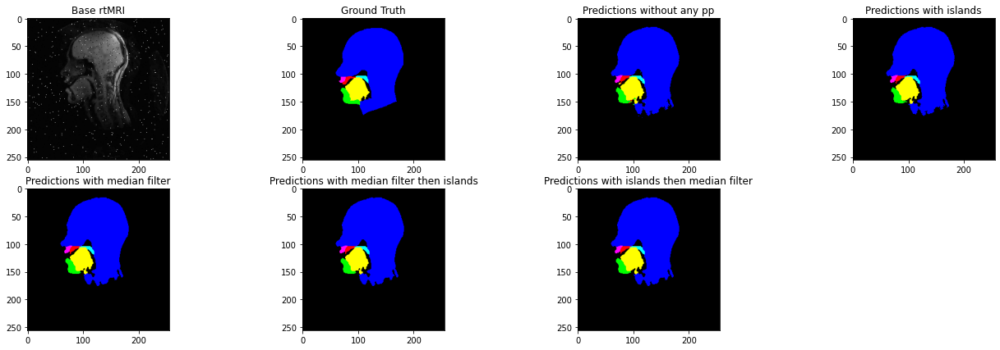

  Img n°: 1 ↓ 


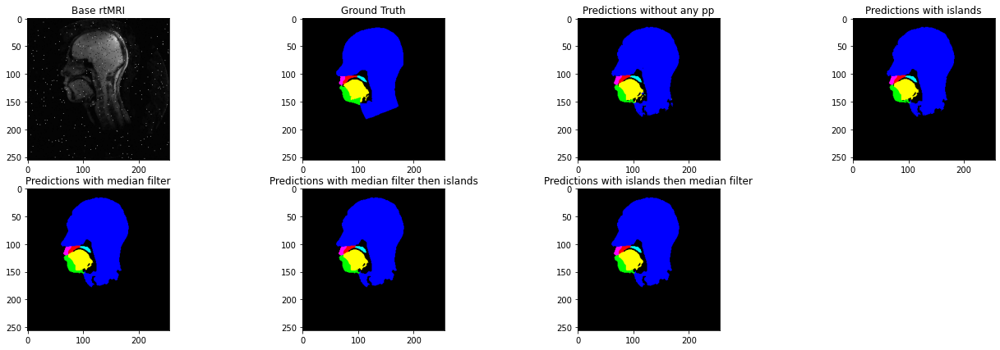

  Img n°: 2 ↓ 


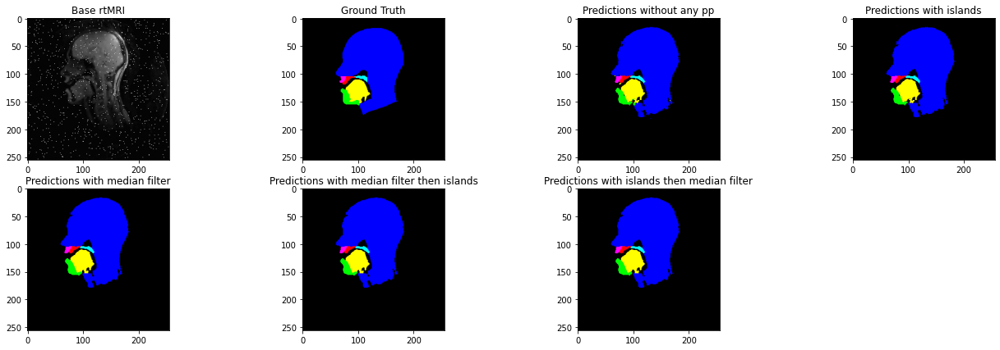

  Img n°: 3 ↓ 


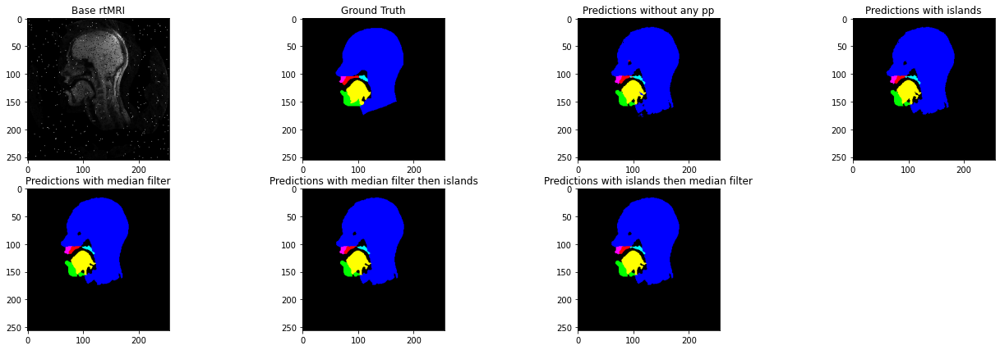

  Img n°: 4 ↓ 


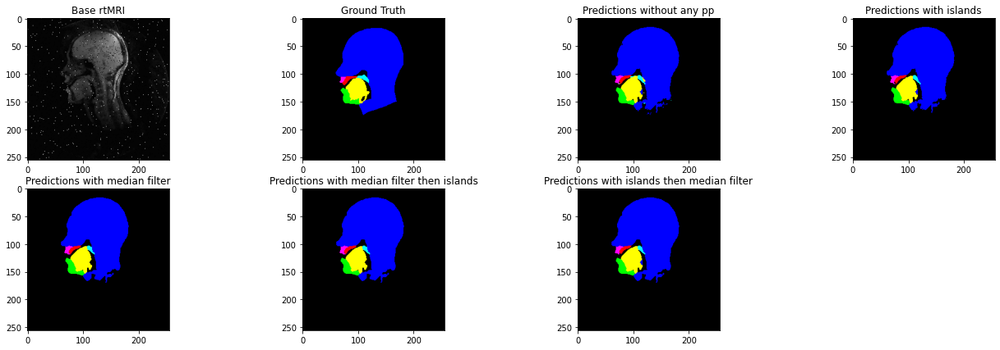

  Img n°: 5 ↓ 


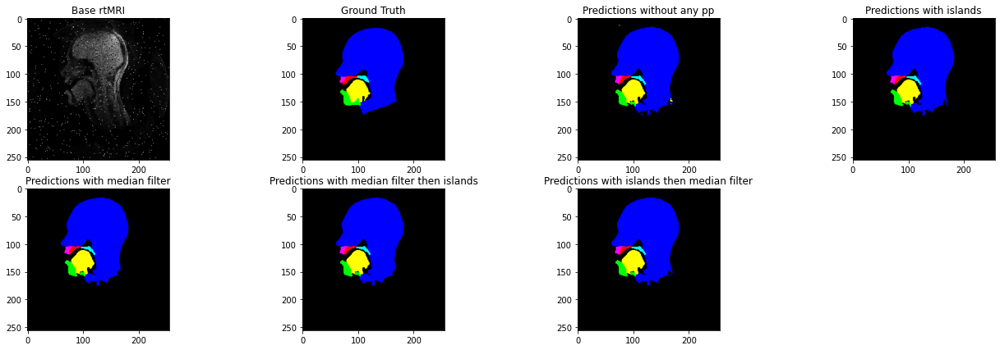

  Img n°: 6 ↓ 


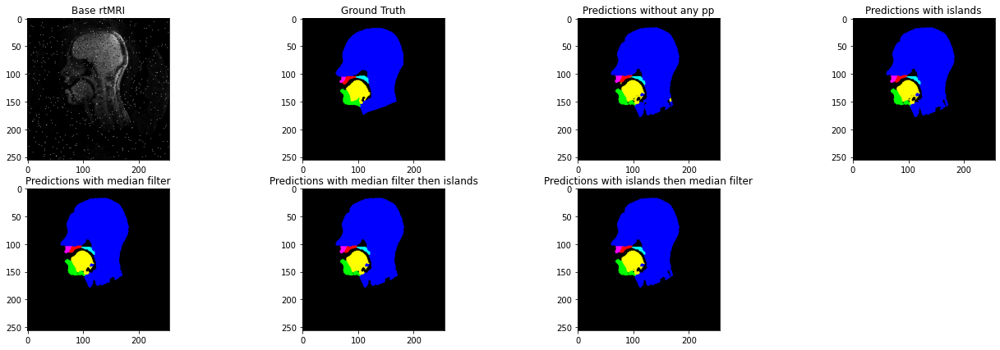

  Img n°: 7 ↓ 


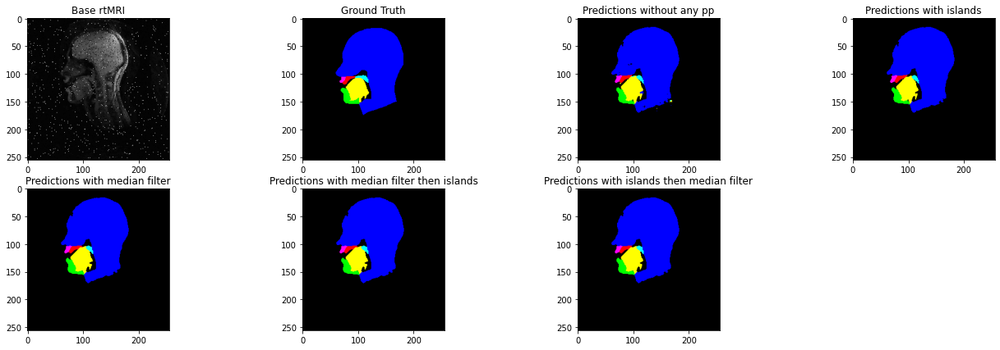

  Img n°: 8 ↓ 


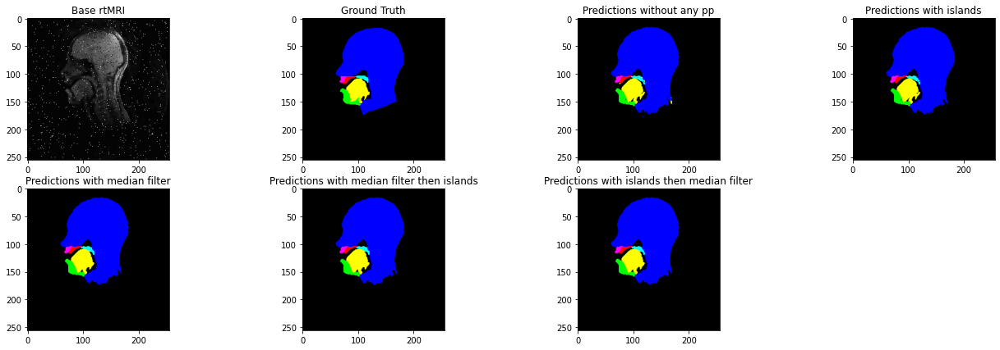

  Img n°: 9 ↓ 


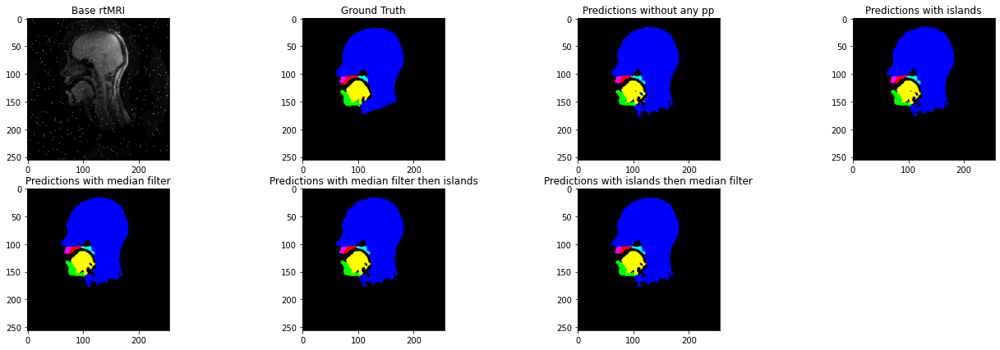

  Img n°: 10 ↓ 


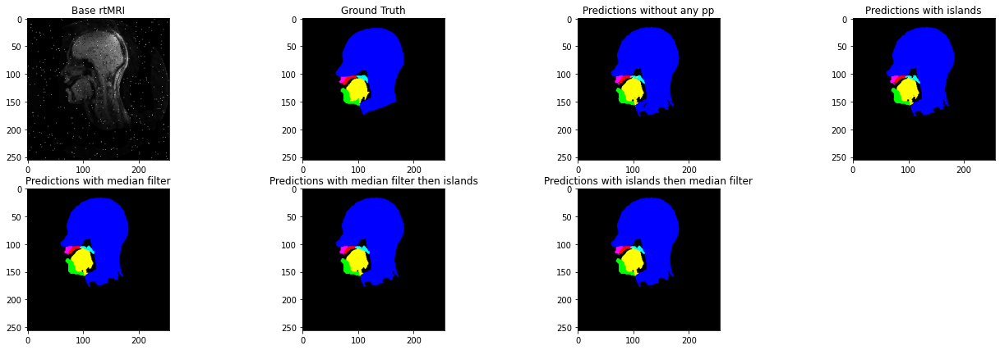

  Img n°: 11 ↓ 


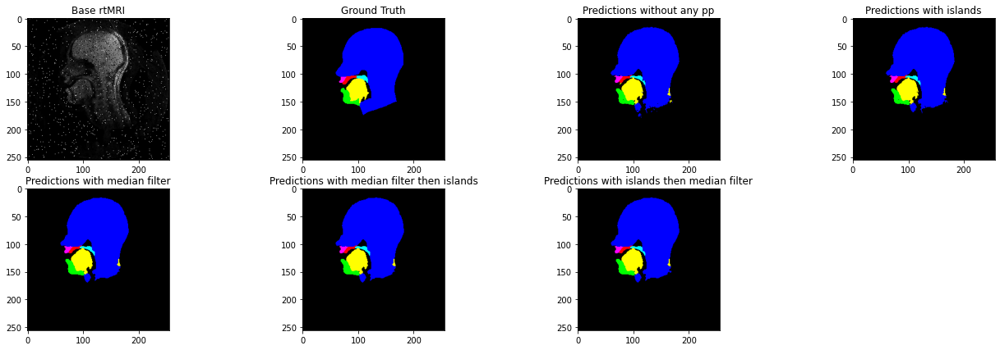

  Img n°: 12 ↓ 


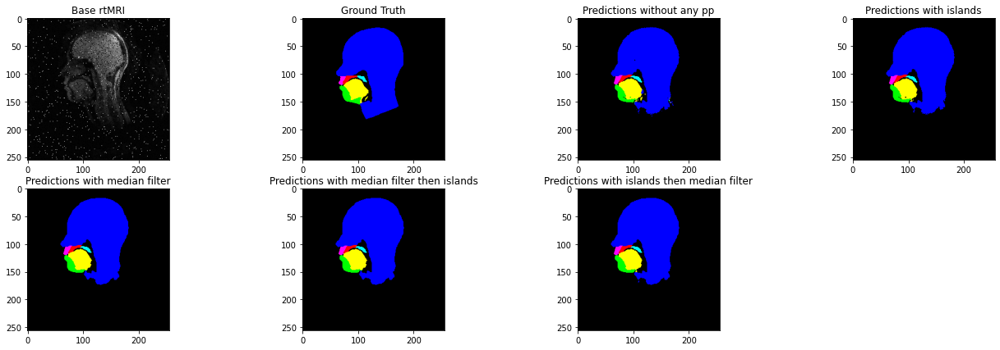

  Img n°: 13 ↓ 


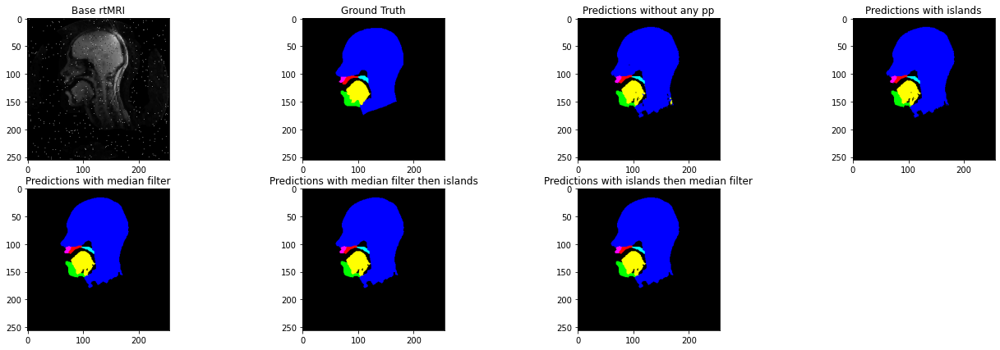

  Img n°: 14 ↓ 


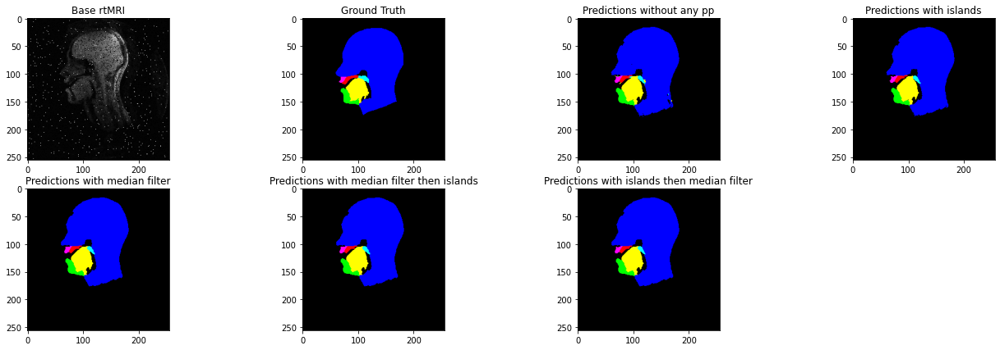

  Img n°: 15 ↓ 


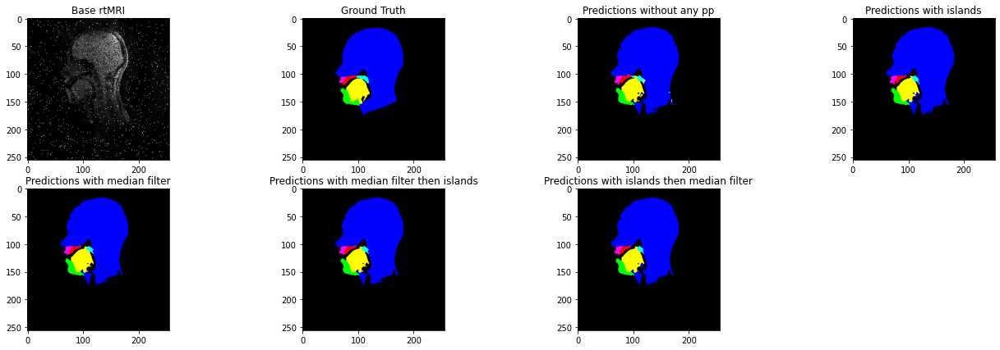

  Img n°: 16 ↓ 


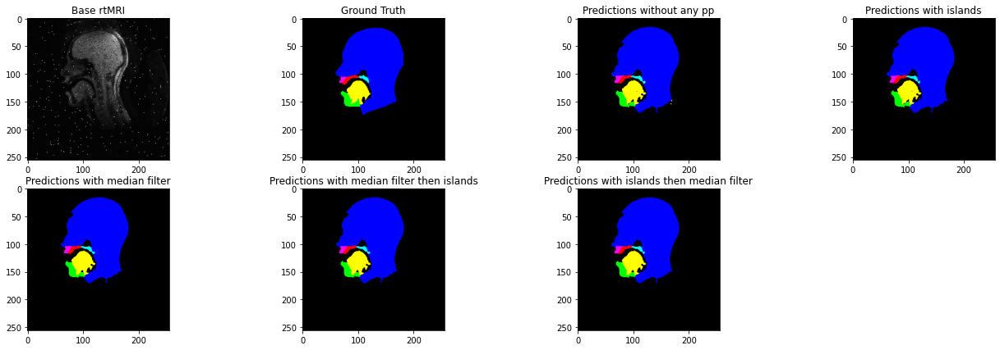

  Img n°: 17 ↓ 


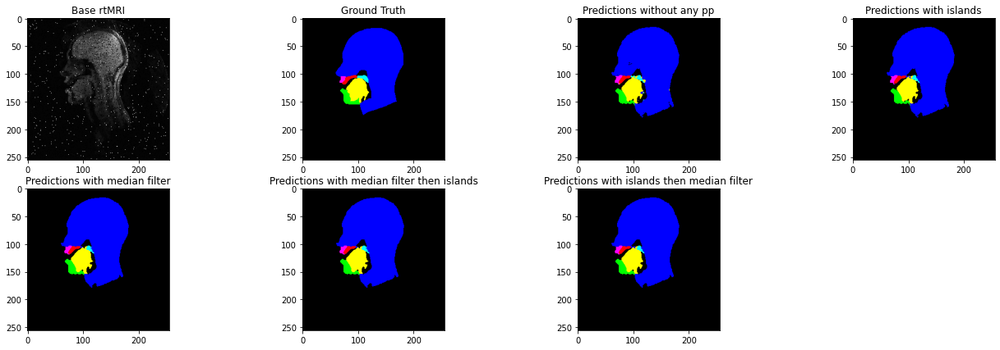

  Img n°: 18 ↓ 


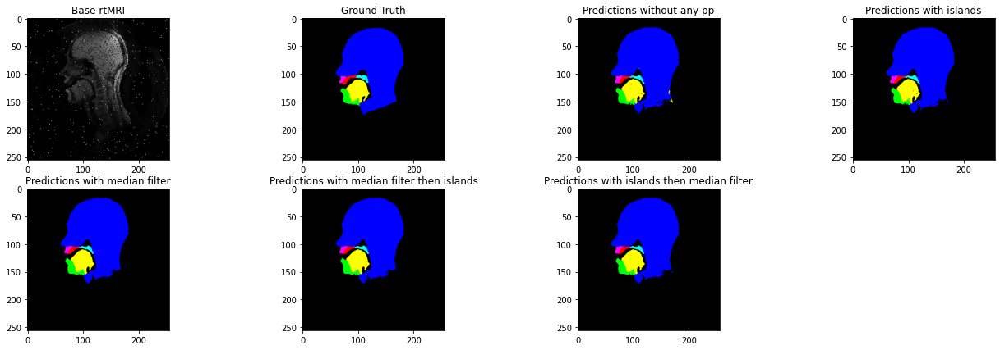

  Img n°: 19 ↓ 


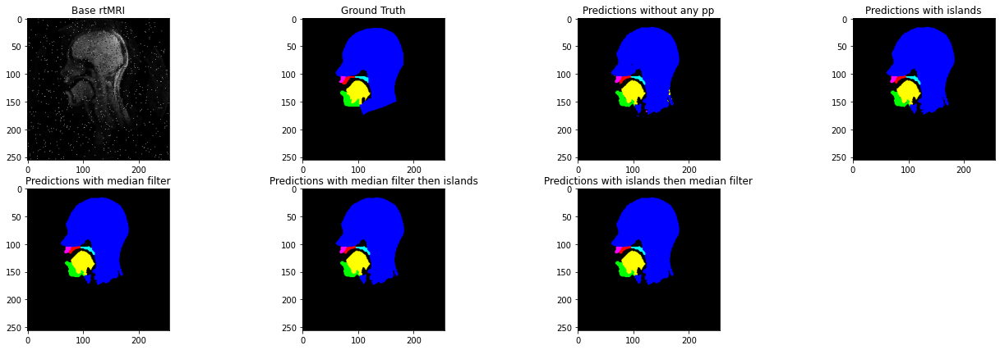

  Img n°: 20 ↓ 


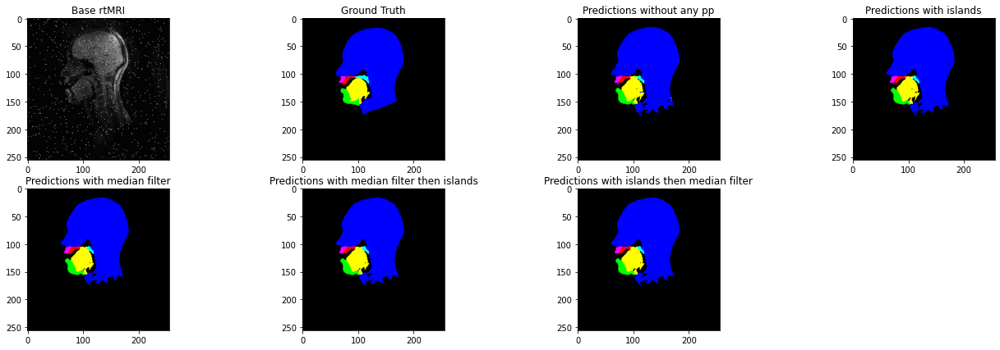

  Img n°: 21 ↓ 


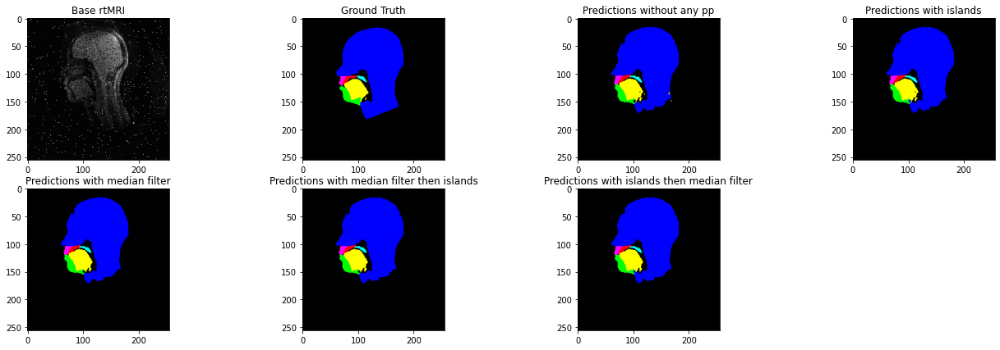

  Img n°: 22 ↓ 


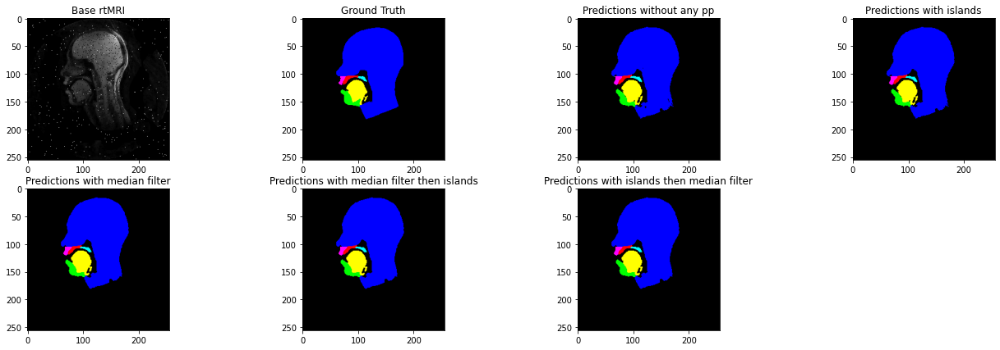

  Img n°: 23 ↓ 


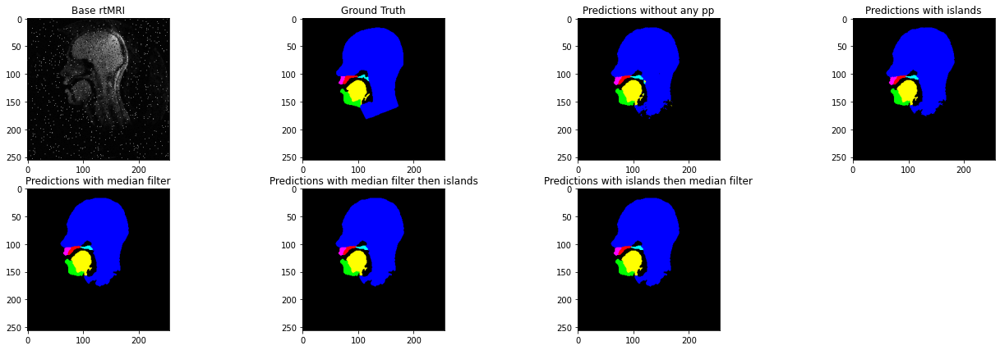

  Img n°: 24 ↓ 


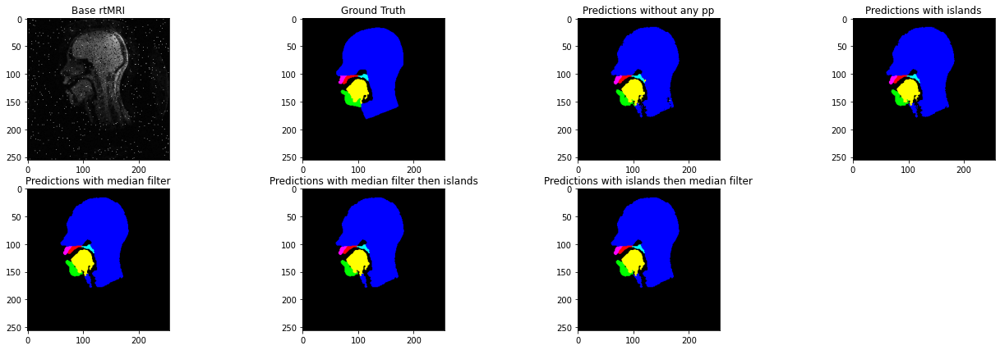

  Img n°: 25 ↓ 


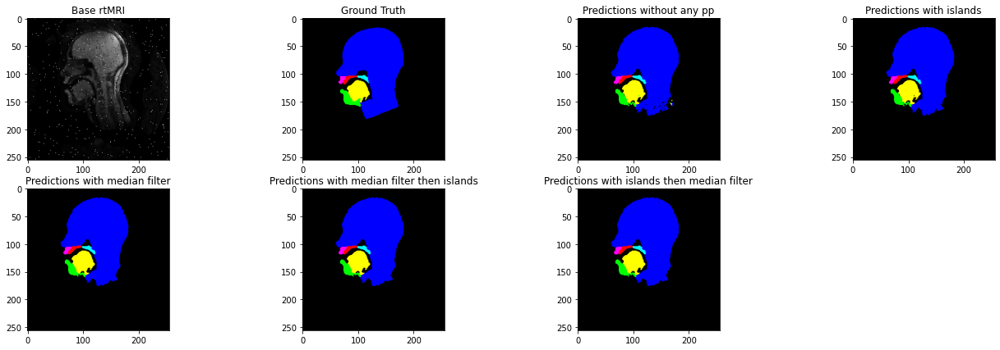

  Img n°: 26 ↓ 


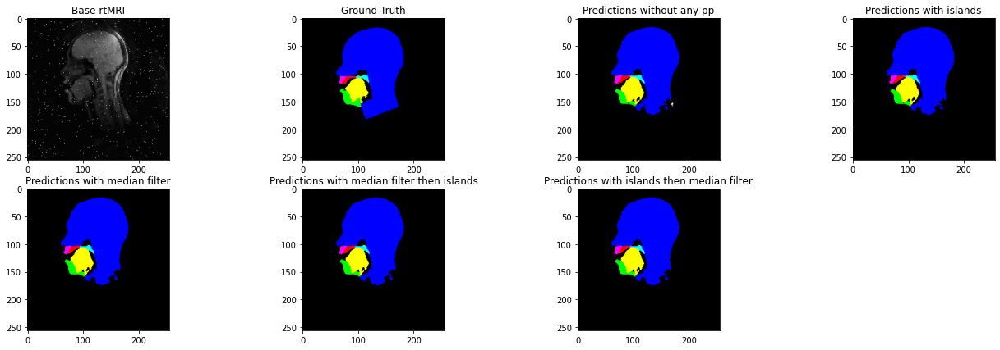

  Img n°: 27 ↓ 


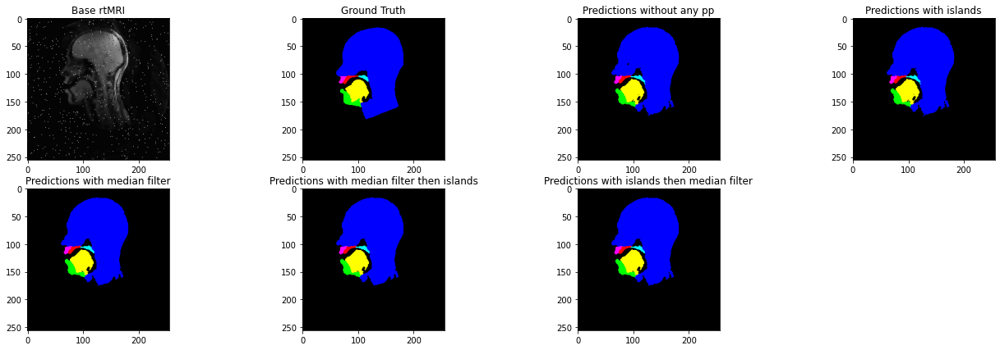

  Img n°: 28 ↓ 


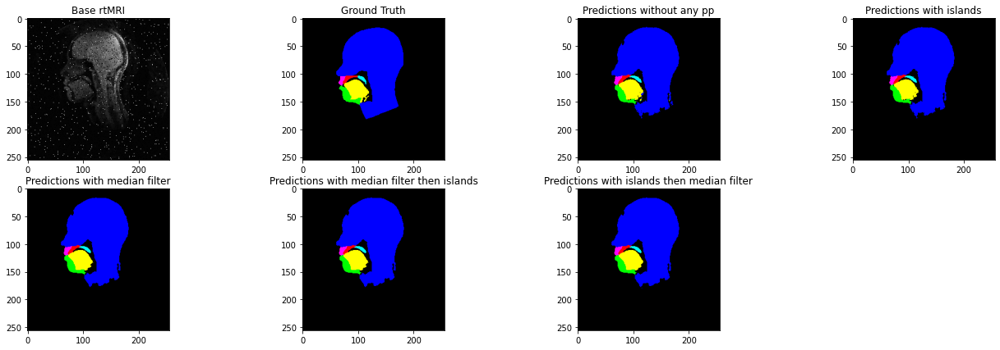

  Img n°: 29 ↓ 


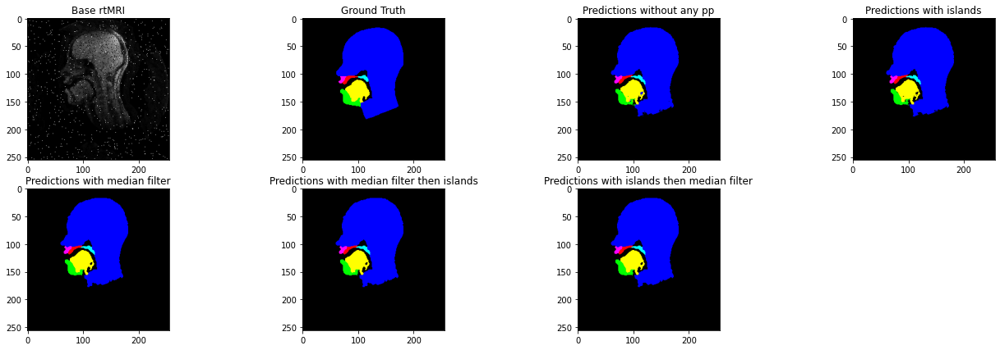

  Img n°: 30 ↓ 


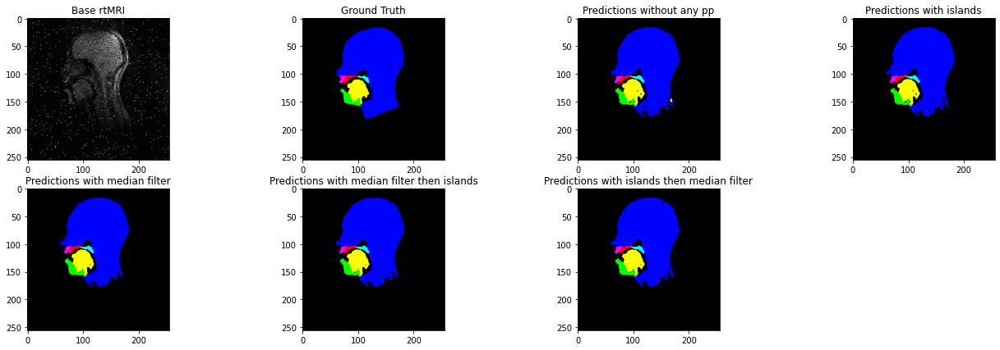

  Img n°: 31 ↓ 


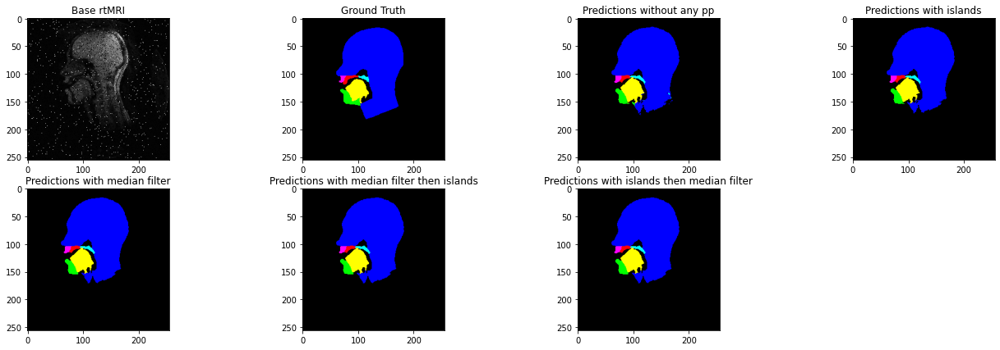

  Img n°: 32 ↓ 


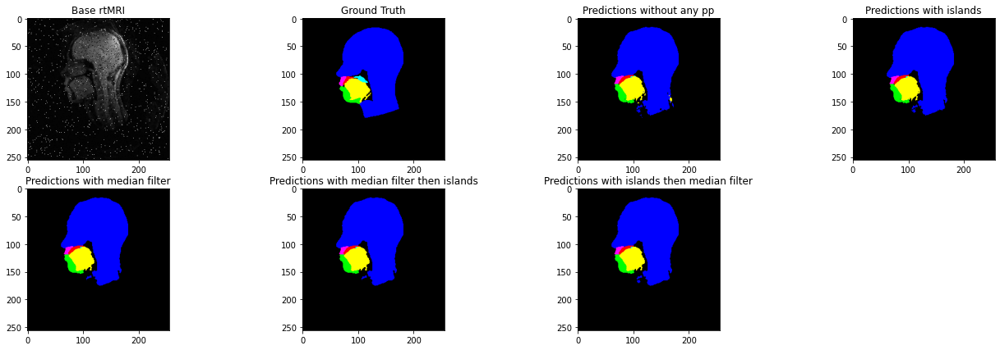

  Img n°: 33 ↓ 


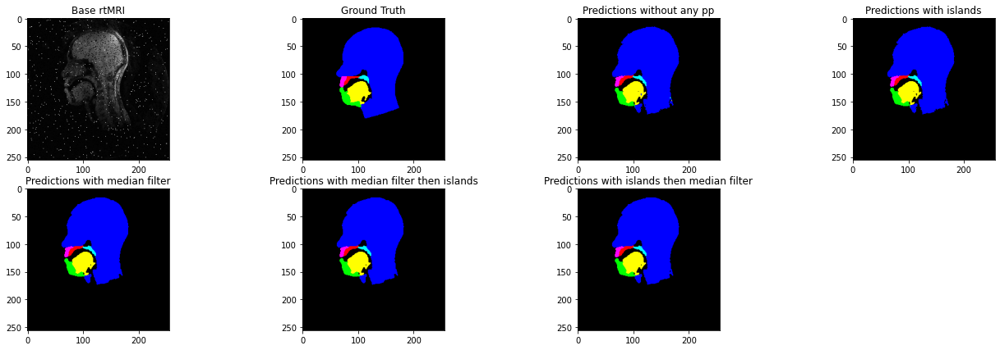

  Img n°: 34 ↓ 


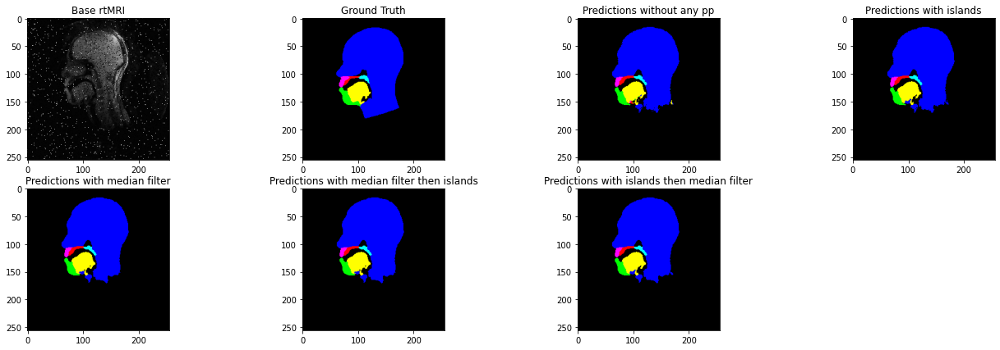

  Img n°: 35 ↓ 


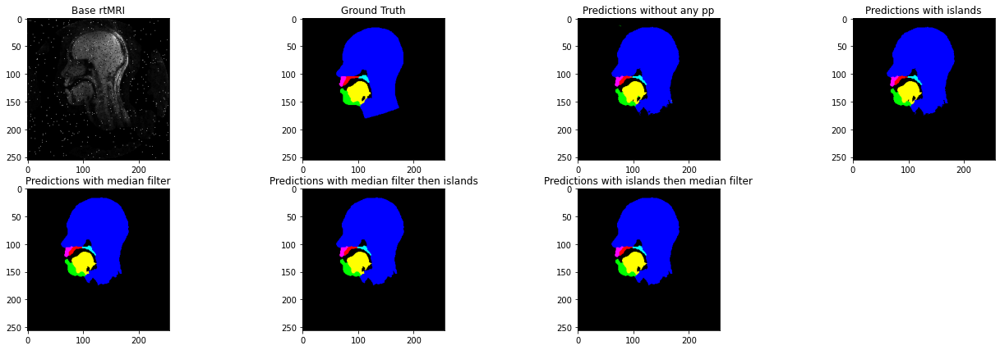

  Img n°: 36 ↓ 


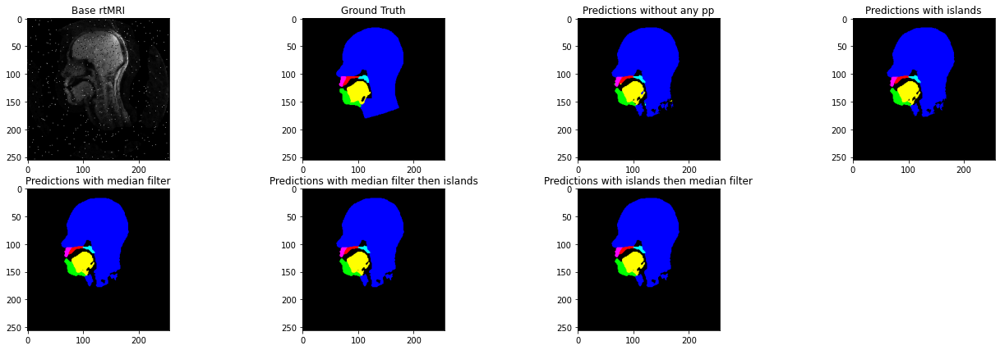

  Img n°: 37 ↓ 


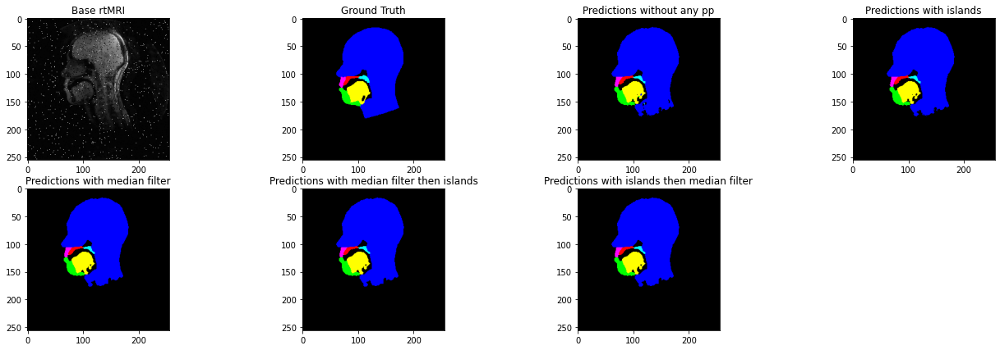

  Img n°: 38 ↓ 


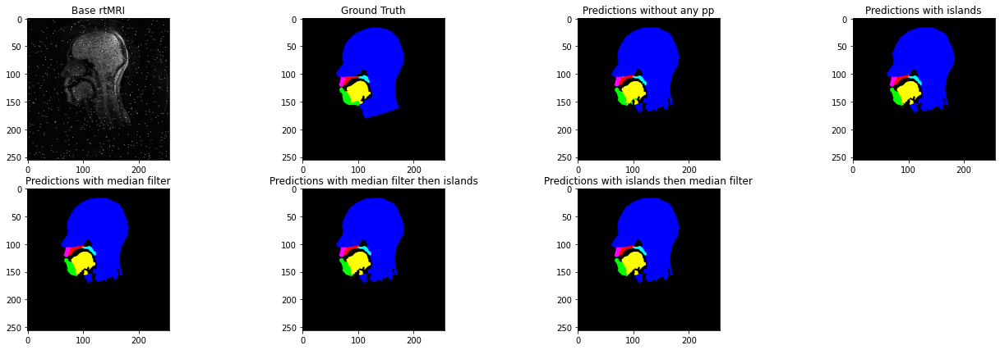

  Img n°: 39 ↓ 


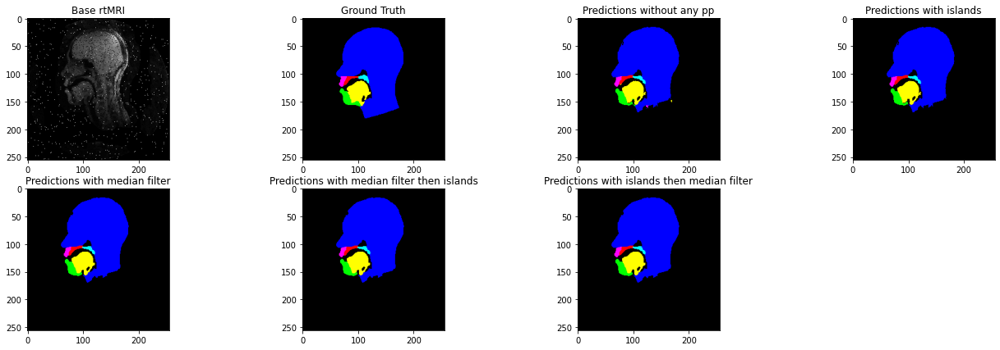

  Img n°: 40 ↓ 


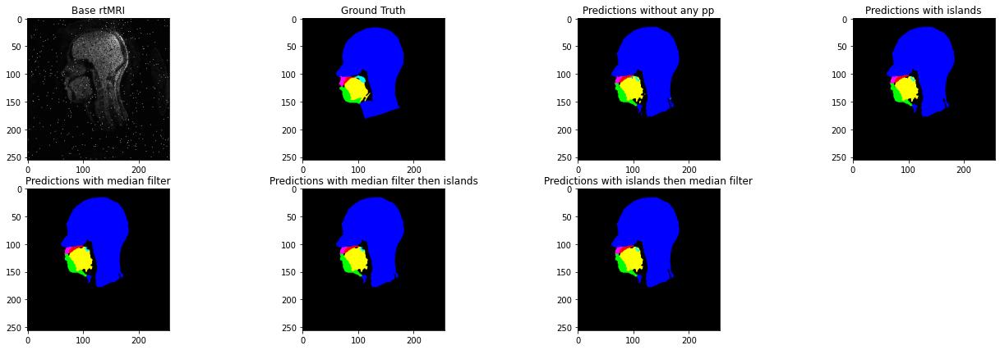

  Img n°: 41 ↓ 


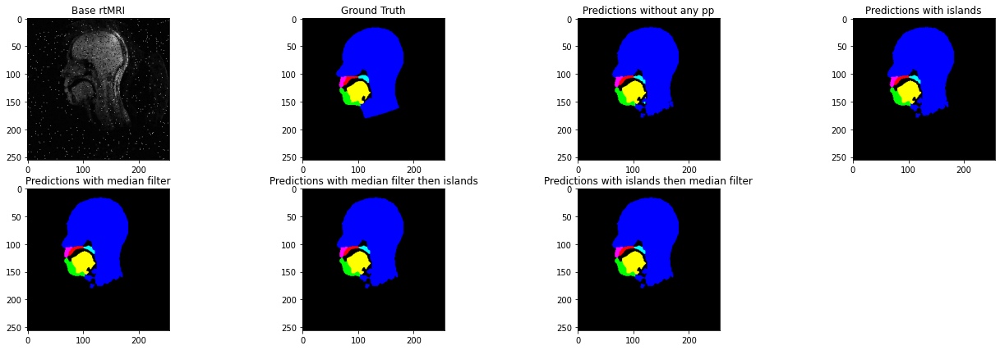

  Img n°: 42 ↓ 


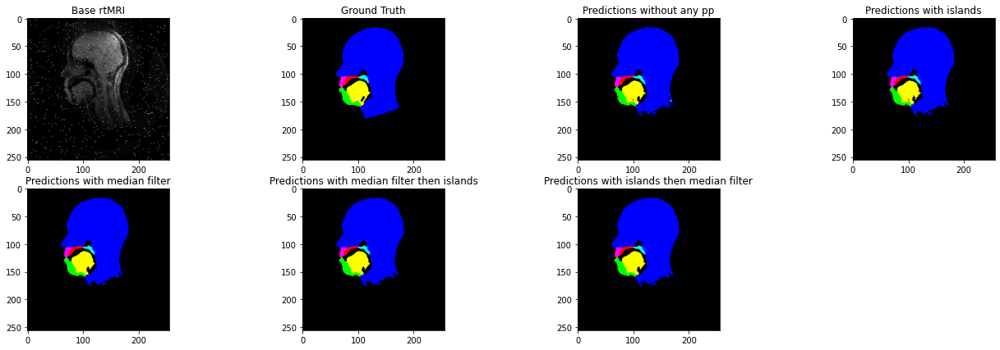

  Img n°: 43 ↓ 


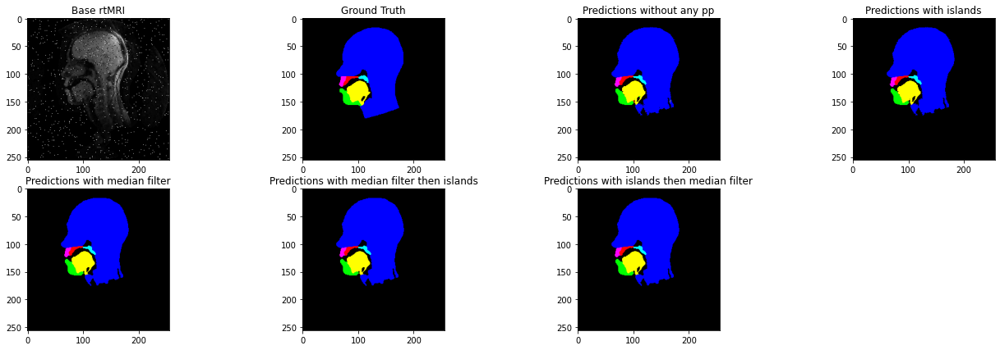

  Img n°: 44 ↓ 


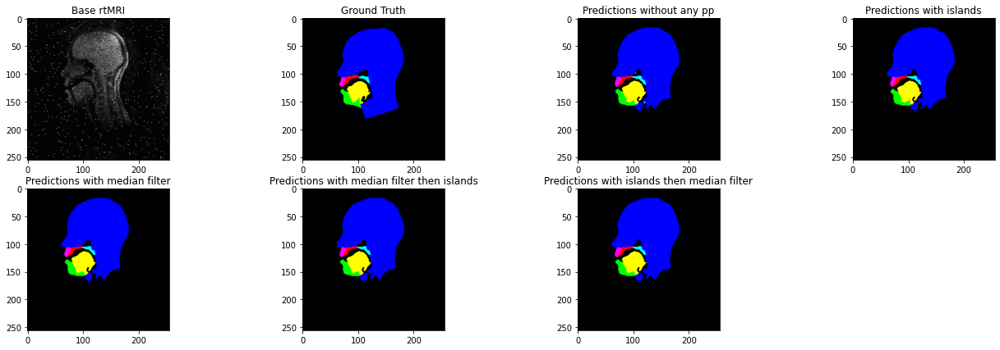

  Img n°: 45 ↓ 


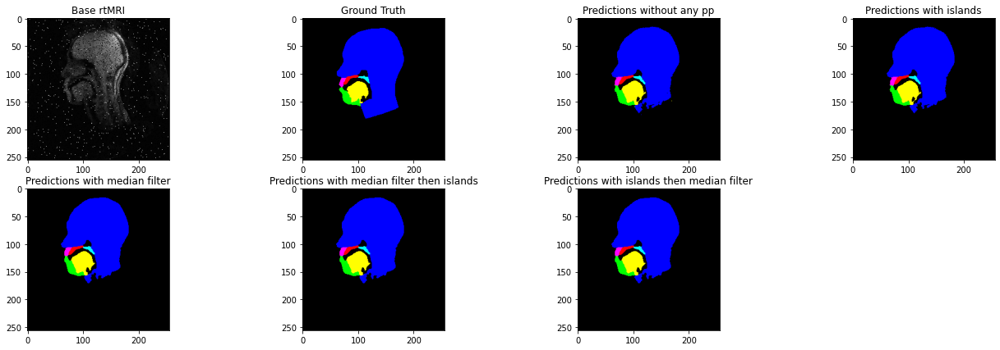

  Img n°: 46 ↓ 


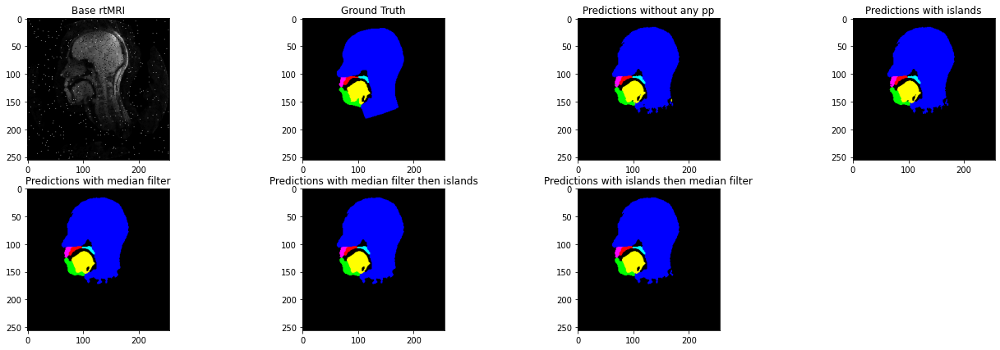

  Img n°: 47 ↓ 


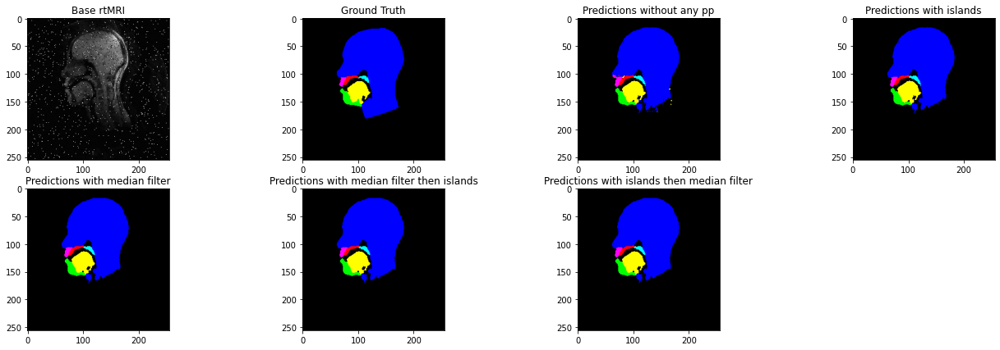

  Img n°: 48 ↓ 


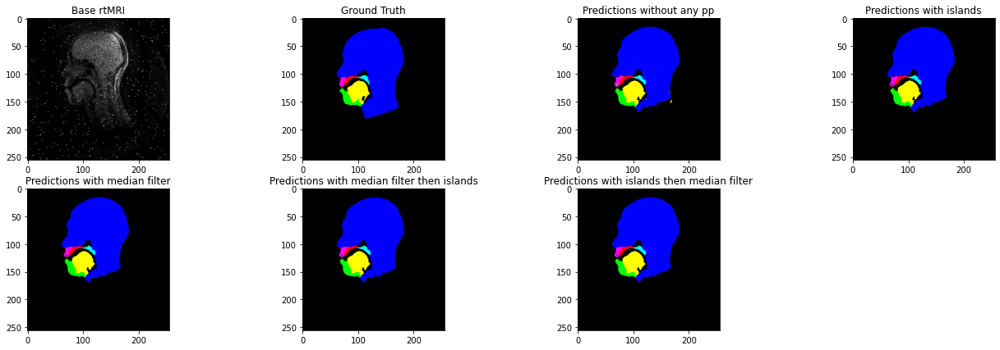

  Img n°: 49 ↓ 


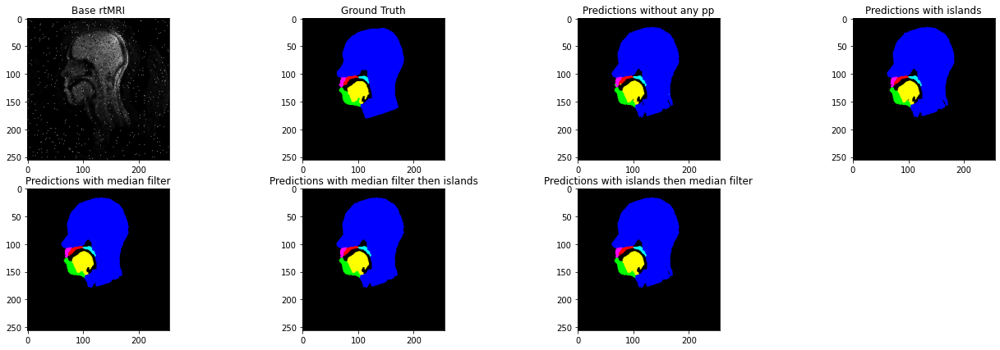

  Img n°: 50 ↓ 


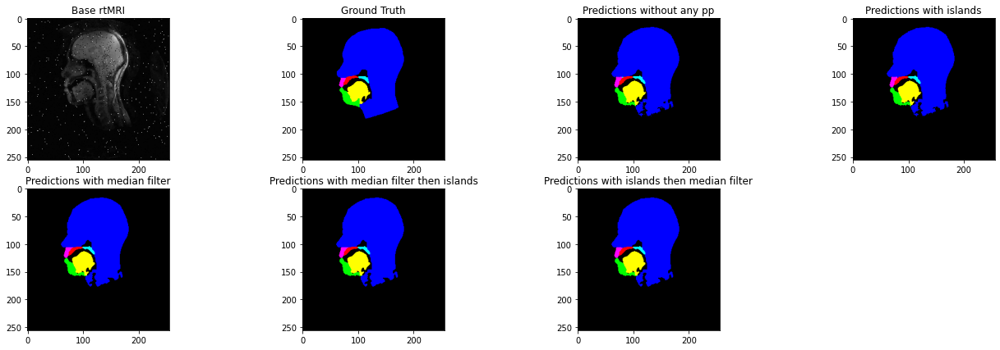

  Img n°: 51 ↓ 


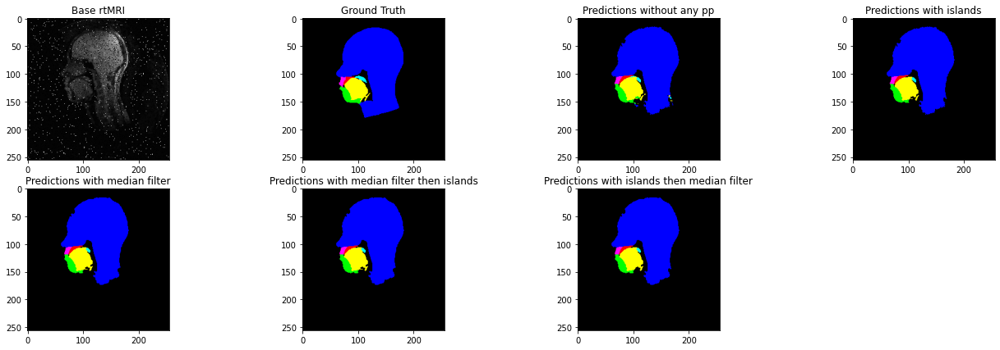

  Img n°: 52 ↓ 


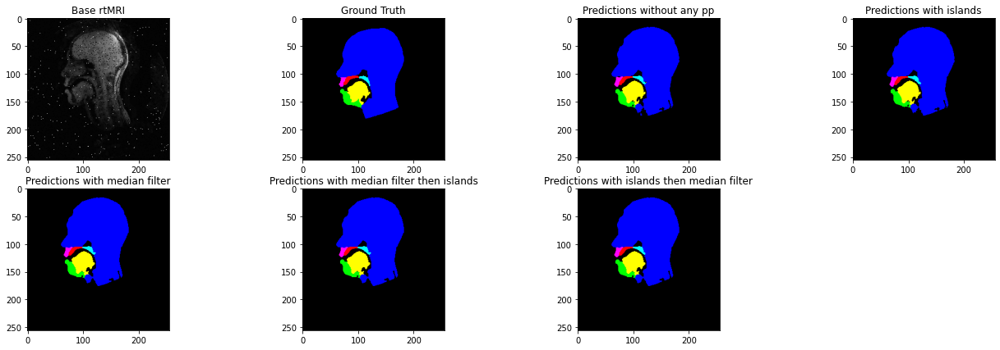

  Img n°: 53 ↓ 


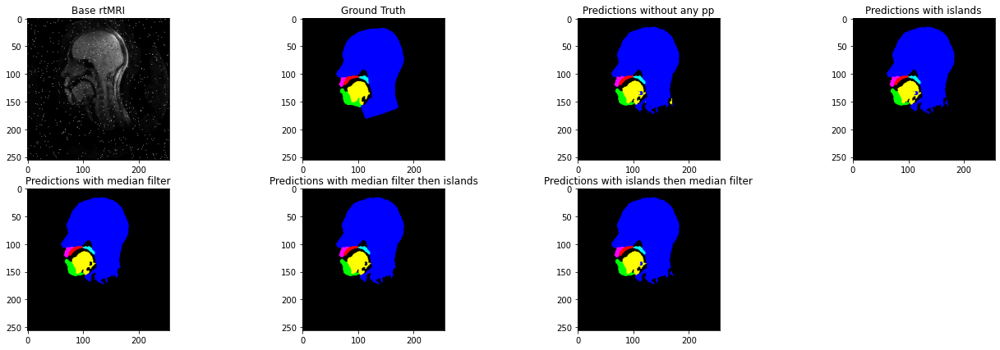

  Img n°: 54 ↓ 


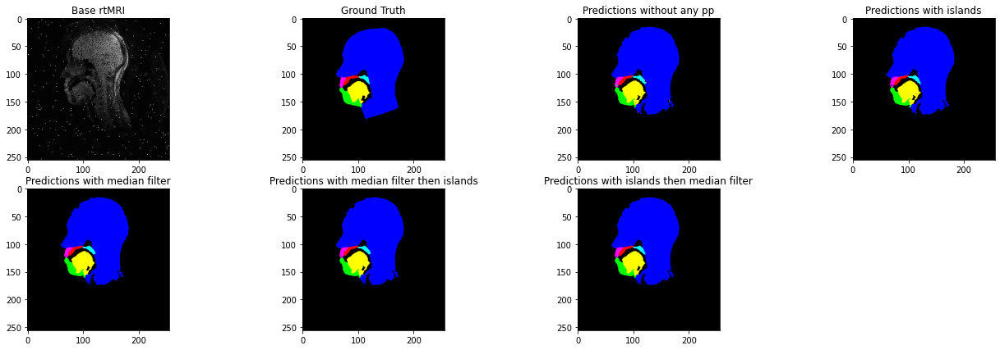

  Img n°: 55 ↓ 


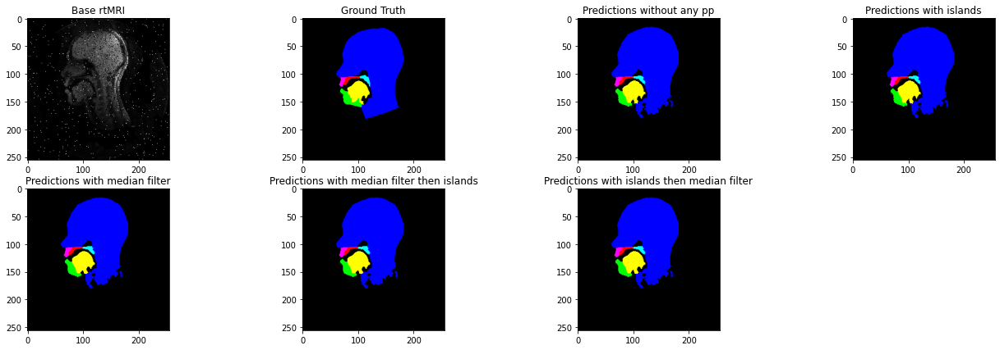

  Img n°: 56 ↓ 


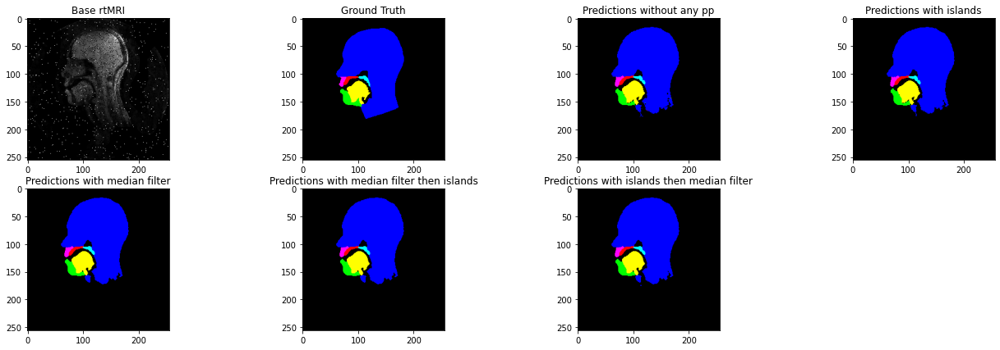

  Img n°: 57 ↓ 


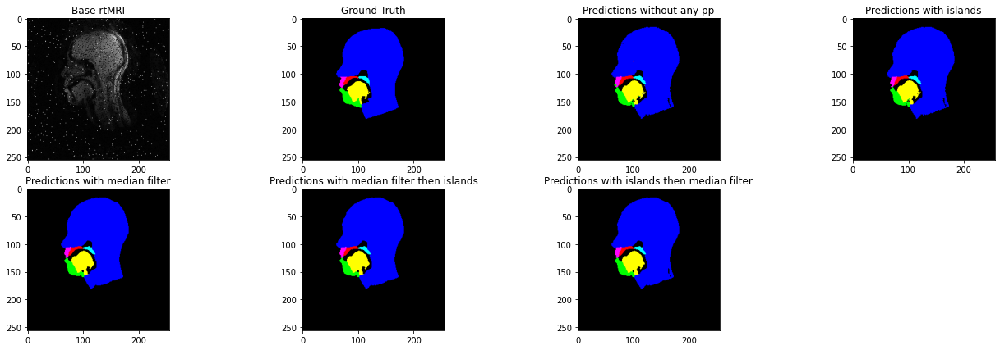

  Img n°: 58 ↓ 


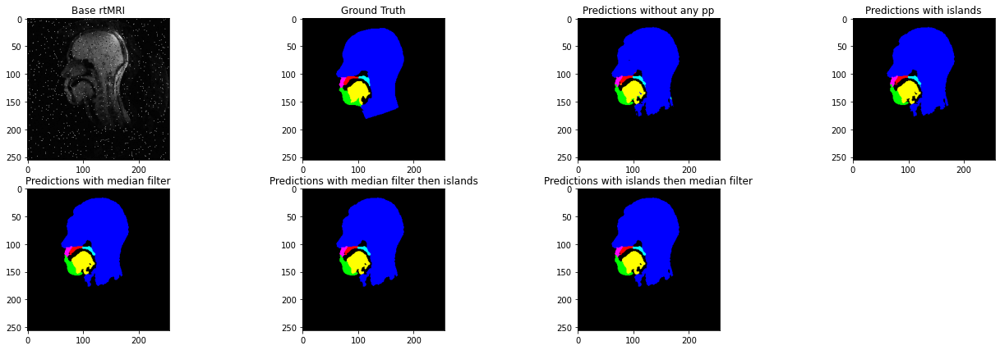

  Img n°: 59 ↓ 


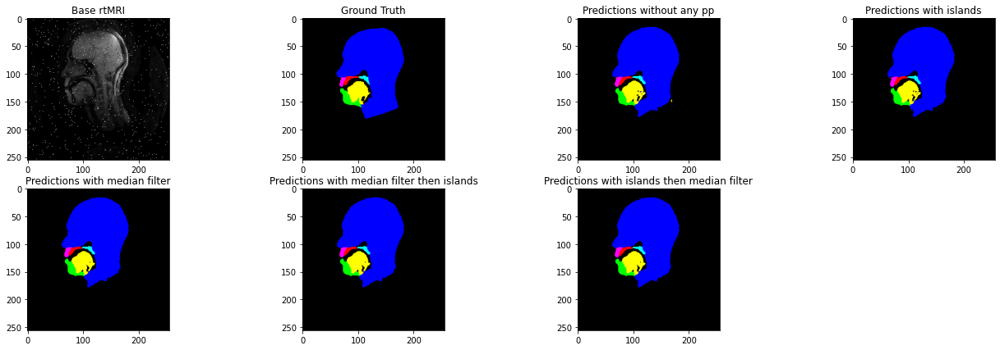

  Img n°: 60 ↓ 


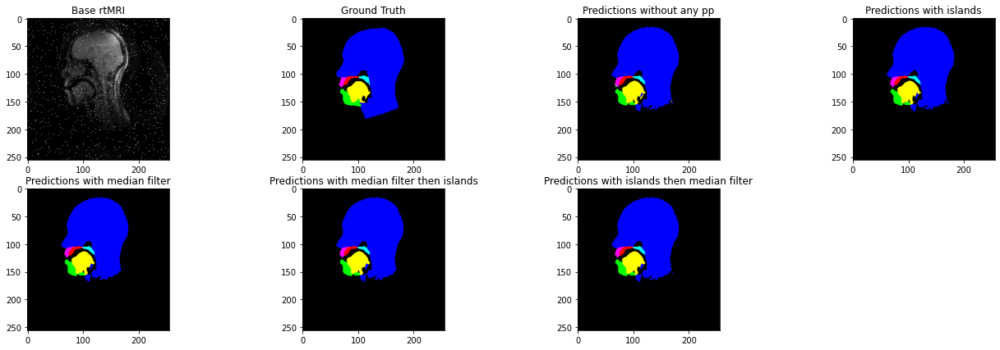

  Img n°: 61 ↓ 


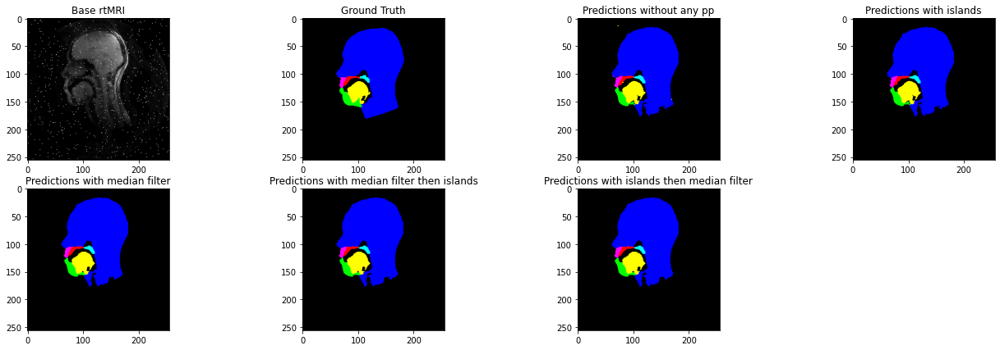

  Img n°: 62 ↓ 


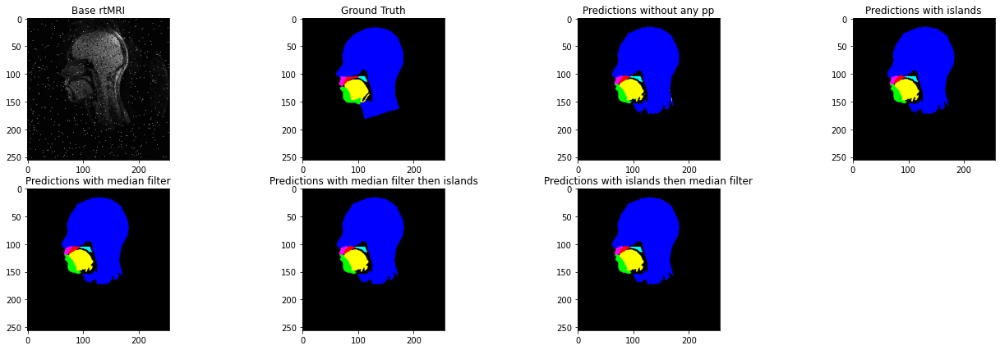

  Img n°: 63 ↓ 


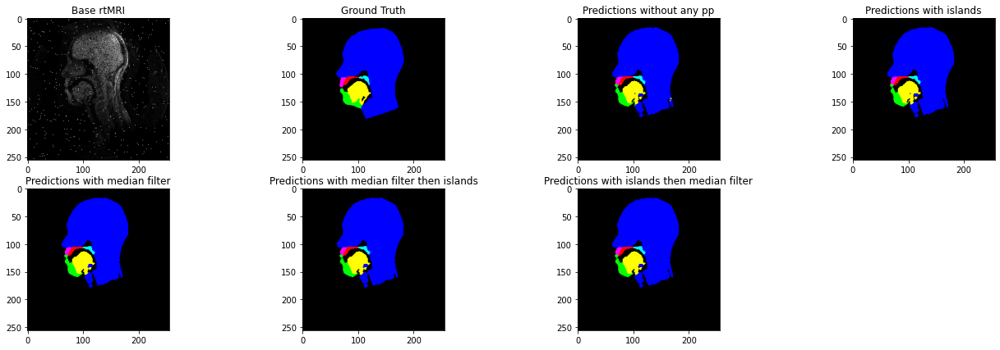

  Img n°: 64 ↓ 


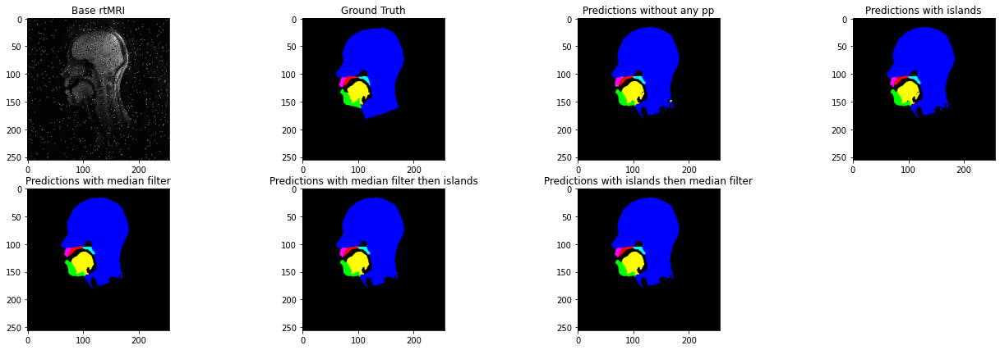

  Img n°: 65 ↓ 


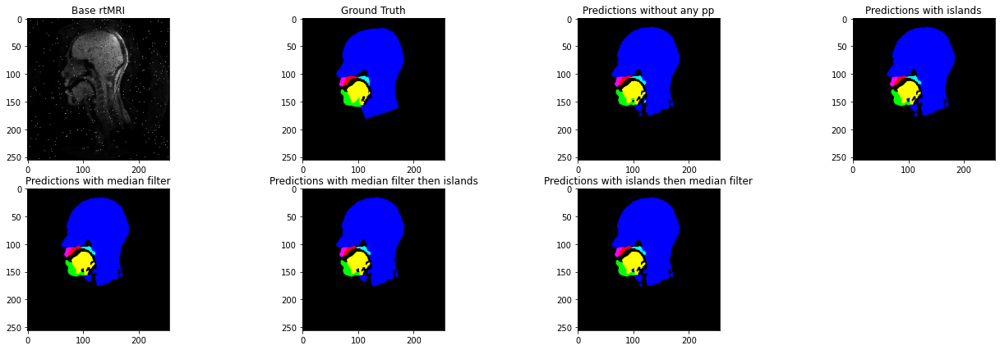

  Img n°: 66 ↓ 


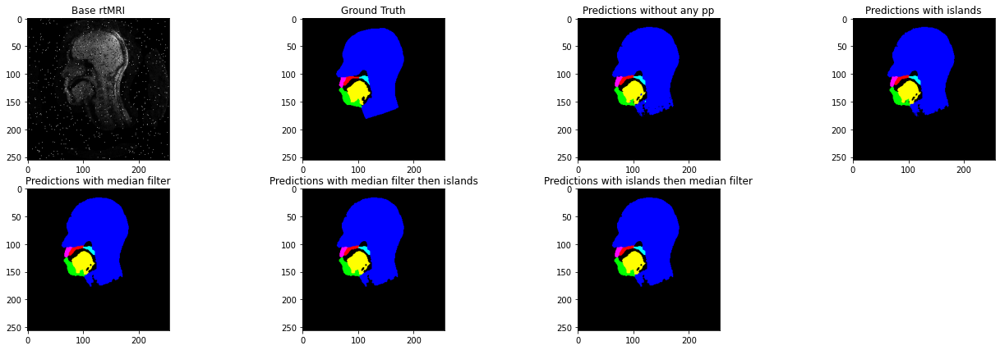

  Img n°: 67 ↓ 


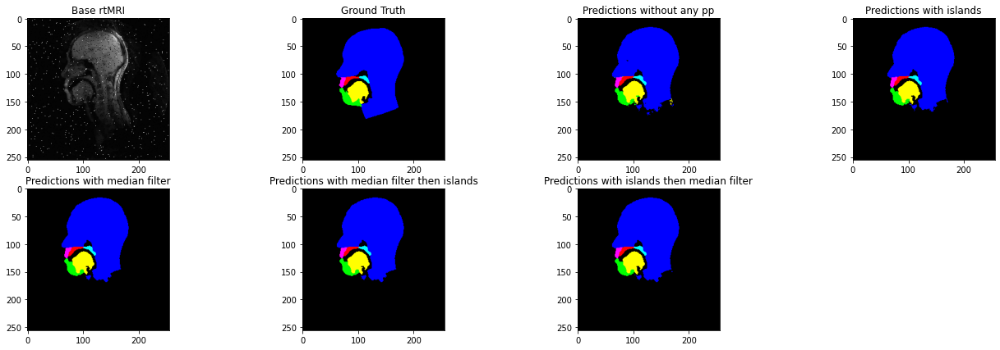

  Img n°: 68 ↓ 


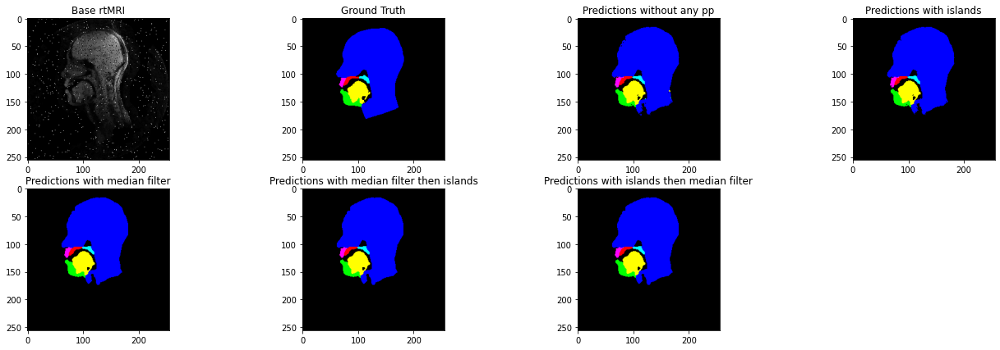

  Img n°: 69 ↓ 


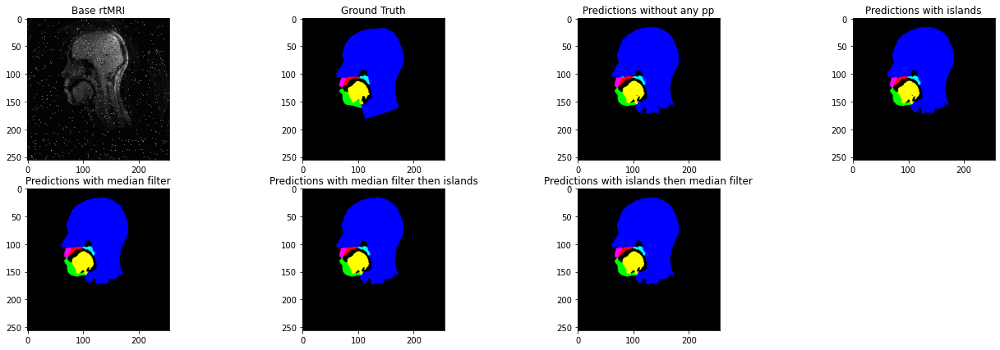

  Img n°: 70 ↓ 


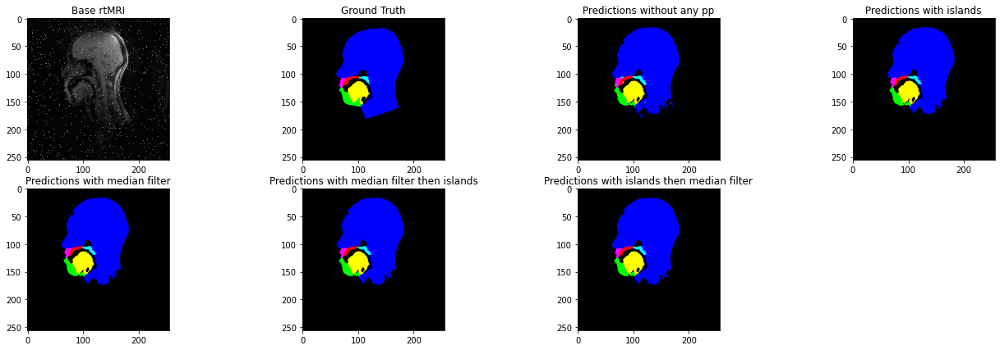

  Img n°: 71 ↓ 


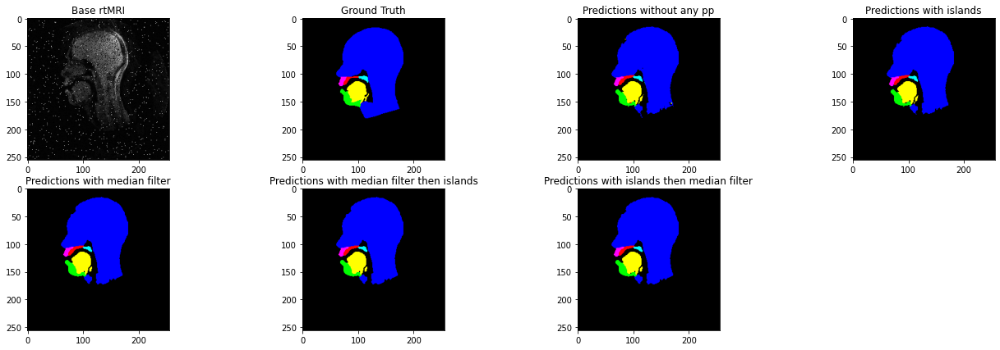

  Img n°: 72 ↓ 


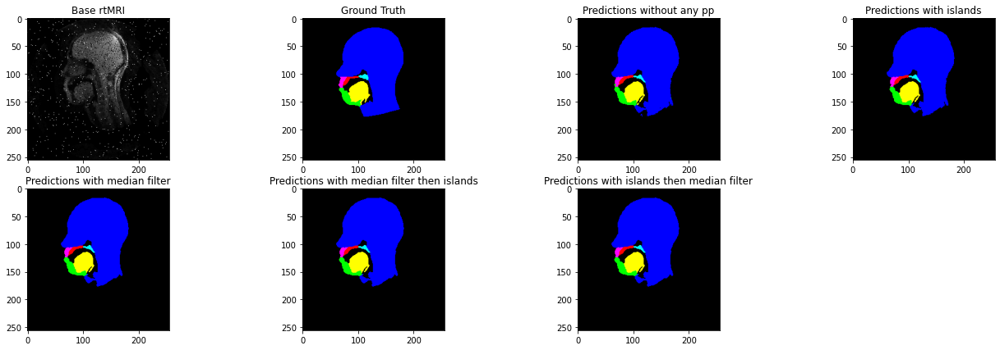

  Img n°: 73 ↓ 


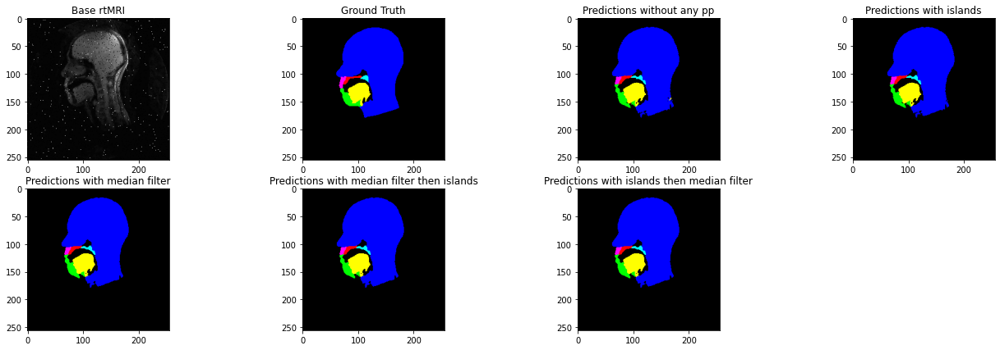

  Img n°: 74 ↓ 


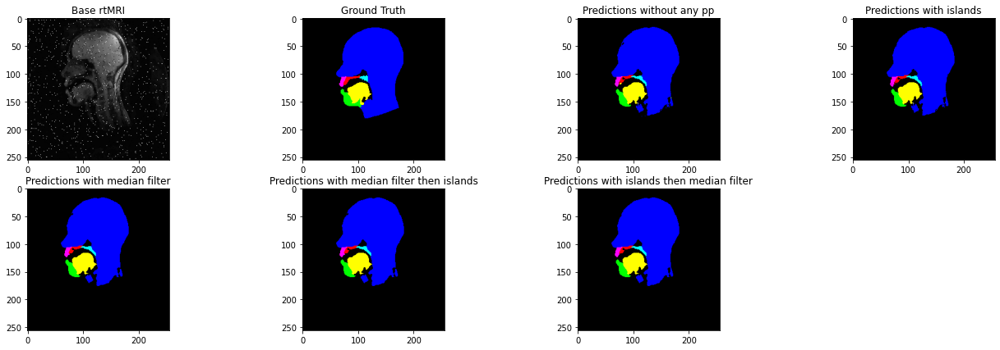

  Img n°: 75 ↓ 


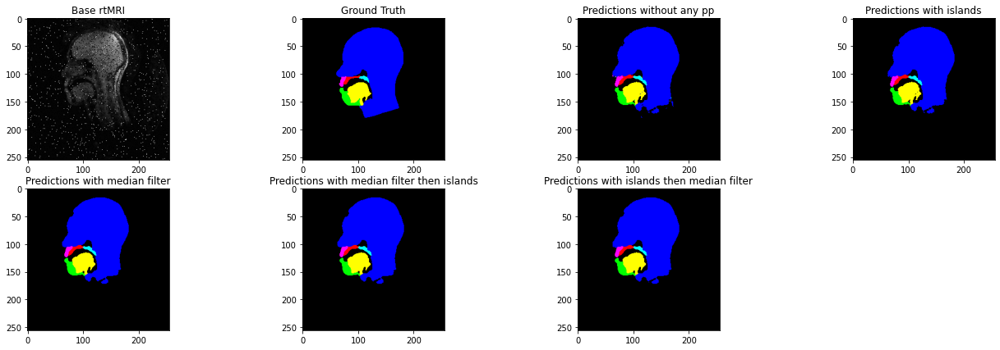

  Img n°: 76 ↓ 


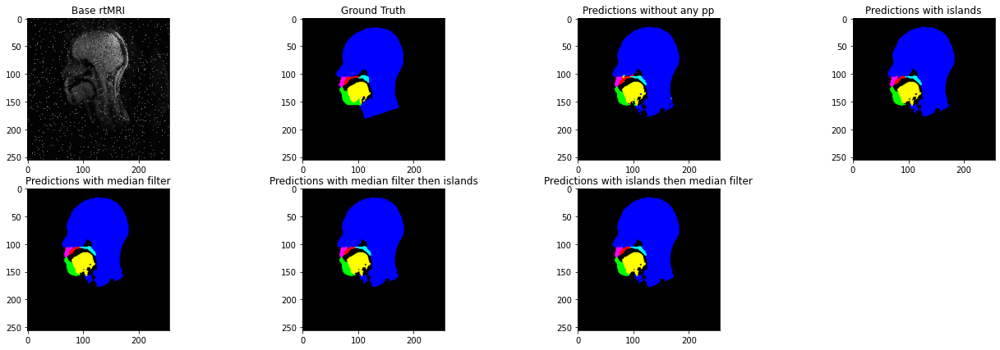

  Img n°: 77 ↓ 


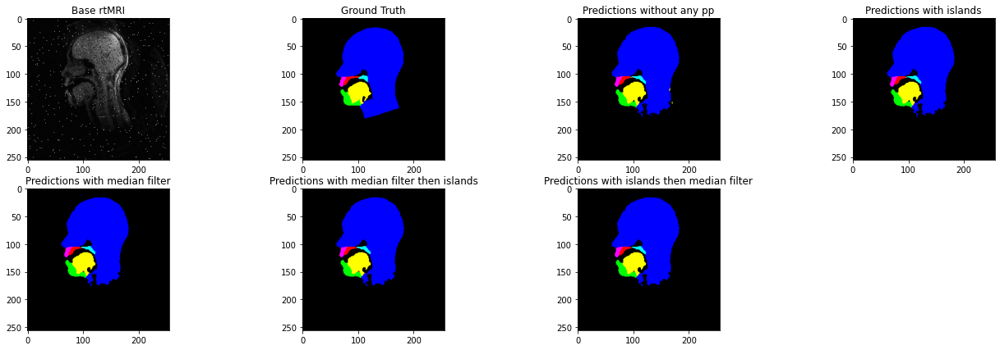

  Img n°: 78 ↓ 


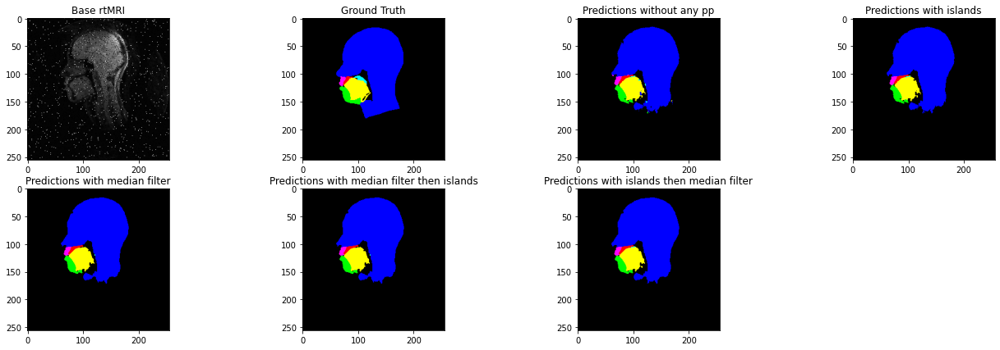

  Img n°: 79 ↓ 


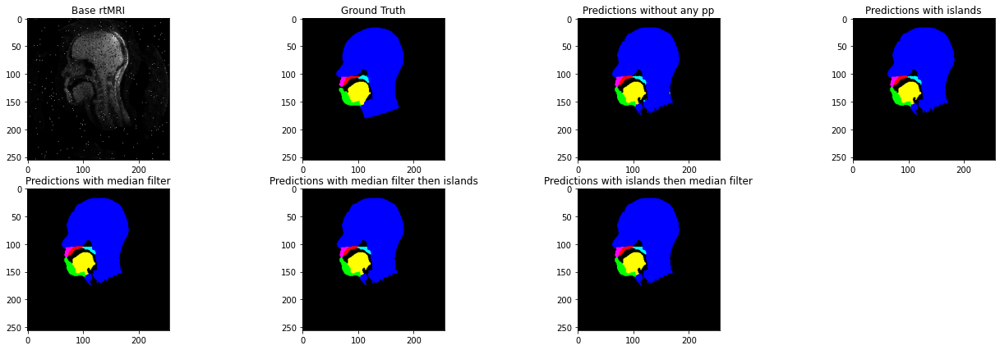

  Img n°: 80 ↓ 


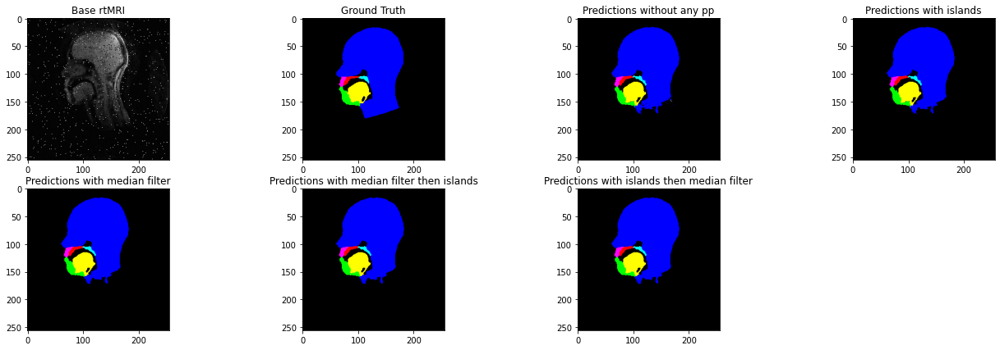

  Img n°: 81 ↓ 


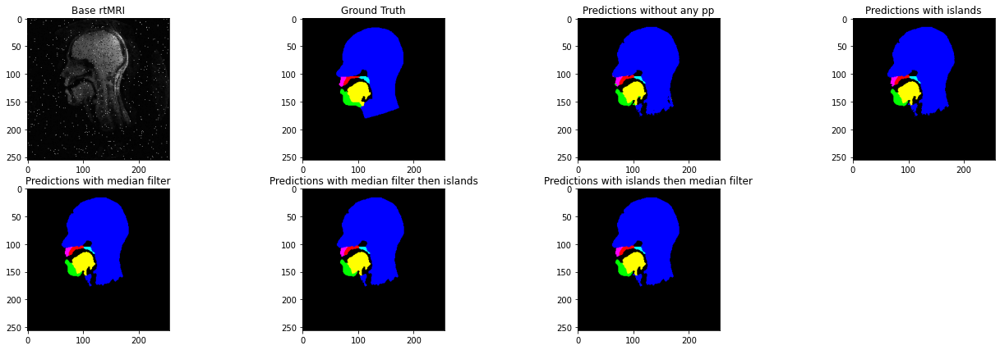

In [ ]:
for n in range(x_test_denoised.shape[0]):
    print("\033[92m \033[1m Img n°: {} ↓ \033[0m".format(n))
    fig = plt.figure(figsize = [23, 7])
    plt.subplot(2, 4, 1)
    plt.title('Base rtMRI')
    plt.imshow(x_test_denoised[n,:,:,0], cmap="gray")
    plt.subplot(2, 4, 2)
    plt.title('Ground Truth')
    plt.imshow(image_truth[n,:,:].astype('uint8'))
    plt.subplot(2, 4, 3)
    plt.title('Predictions without any pp')
    plt.imshow(image_predictions_raw[n,:,:].astype('uint8'))
    plt.subplot(2, 4, 4)
    plt.title('Predictions with islands')
    plt.imshow(image_predictions_islands[n,:,:].astype('uint8'))
    plt.subplot(2, 4, 5)
    plt.title('Predictions with median filter')
    plt.imshow(image_predictions_filtered[n,:,:].astype('uint8'))
    plt.subplot(2, 4, 6)
    plt.title('Predictions with median filter then islands')
    plt.imshow(image_predictions_filtered_then_islands[n,:,:].astype('uint8'))
    plt.subplot(2, 4, 7)
    plt.title('Predictions with islands then median filter')
    plt.imshow(image_predictions_islands_then_filtered[n,:,:].astype('uint8'))

    plt.show(fig)

## Garbage collector


In [ ]:
del x_train, x_test, x_val, y_train, y_test, y_val
import gc
gc.collect()